### Predicción de la bomba

El objetivo de este proyecto es construir un modelo usando datos de Taarifa and the Tanzanian Ministry of Water para predicir qué bombas son:

1. Functional

2. Functional needs repair 

3. Non-functional

La predicción de una de las tres clases se basa en una serie de variables.

Los datos son de www.drivendata.org

### Paquetes

In [1]:
#General Paquetes
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import norm, skew, randint
import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 200)

In [3]:
#Preprocessing Paquetes
import ydata_profiling
import missingno as msno
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from collections import Counter

In [4]:
#Model Paquetes
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

In [5]:
#Model Analysis Paquetes
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, StratifiedKFold, RepeatedStratifiedKFold
from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve, classification_report
from imblearn.over_sampling import SMOTE

## 1. Cargar Datos

In [6]:
train_set = pd.read_csv('train_set.csv')

In [7]:
labels = pd.read_csv('train_labels.csv')

In [8]:
test_set = pd.read_csv('test_set.csv')

In [9]:
train = pd.merge(train_set, labels, on='id')

In [10]:
all = pd.concat([train, test_set])
all.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,3/14/2011,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,3/6/2013,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2/25/2013,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,1/28/2013,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,7/13/2011,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


## 2. EDA 

#### Frecuencia de clase:

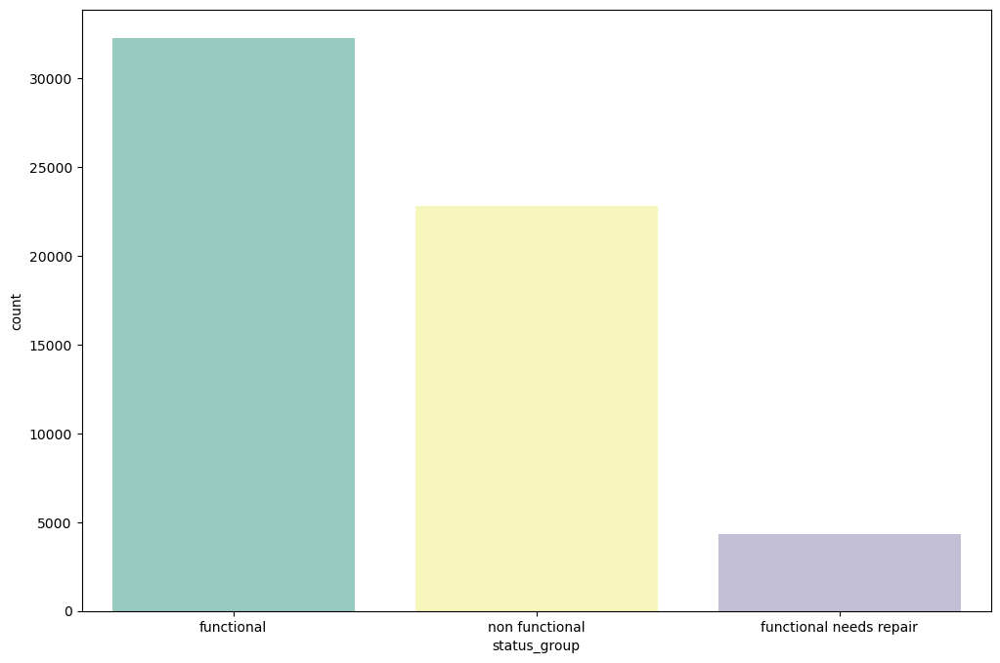

Hay 22824 Shutdown o 38.424%, 4317 Repair o 7.268% y 32259 Functional o 54.308%.


In [11]:
plt.figure(figsize=(12,8))
sns.countplot(data = train, x = 'status_group', palette = "Set3")
train.status_group.value_counts()


counts = train.status_group.value_counts()
Functional = counts['functional']
Repair = counts['functional needs repair']
Shutdown = counts['non functional']
perc_functional = (Functional/(Shutdown+Repair+Functional))*100
perc_repair = (Repair/(Shutdown+Repair+Functional))*100
perc_shutdown = (Shutdown/(Shutdown+Repair+Functional))*100
plt.show()
print('Hay {} Shutdown o {:.3f}%, {} Repair o {:.3f}% y {} Functional o {:.3f}%.'.format(
    Shutdown, perc_shutdown, Repair, perc_repair, Functional, perc_functional))

#### Features

In [12]:
numerical_features = train.select_dtypes(exclude=['object', 'category']).columns.to_list()
categorical_features = train.select_dtypes(include=['object', 'category']).columns.to_list()
numerical_features, categorical_features

(['id',
  'amount_tsh',
  'gps_height',
  'longitude',
  'latitude',
  'num_private',
  'region_code',
  'district_code',
  'population',
  'construction_year'],
 ['date_recorded',
  'funder',
  'installer',
  'wpt_name',
  'basin',
  'subvillage',
  'region',
  'lga',
  'ward',
  'public_meeting',
  'recorded_by',
  'scheme_management',
  'scheme_name',
  'permit',
  'extraction_type',
  'extraction_type_group',
  'extraction_type_class',
  'management',
  'management_group',
  'payment',
  'payment_type',
  'water_quality',
  'quality_group',
  'quantity',
  'quantity_group',
  'source',
  'source_type',
  'source_class',
  'waterpoint_type',
  'waterpoint_type_group',
  'status_group'])

In [13]:
def distribution_checker (data, xlabel):
  grouped = data.groupby([xlabel, 'status_group'])['id'].count().reset_index()
  pivot = grouped.pivot_table(index = xlabel, columns = 'status_group', fill_value = 0)
  mi=pivot.columns
  mi.tolist()
  ind = pd.Index([ str(e[1])  for e in mi.tolist()])
  pivot.columns = ind
  pivot['num_pumps'] = pivot['functional'] +pivot['functional needs repair'] +pivot['non functional']
  pivot['all_pumps'] = pivot['num_pumps'].sum()
  pivot['perc_total_pumps'] =((pivot['num_pumps']/pivot['all_pumps'])*100).round(1)
  pivot['perc_functional'] = ((pivot['functional']/pivot['num_pumps'])*100).round(1)
  pivot['perc_non_functional'] = ((pivot['non functional']/pivot['num_pumps'])*100).round(1)
  pivot['perc_functional_needs_repair'] = ((pivot['functional needs repair']/pivot['num_pumps'])*100).round(1)
  pivot = pivot.drop(['functional', 'functional needs repair', 'non functional', 'all_pumps'], axis=1)
  return(pivot)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

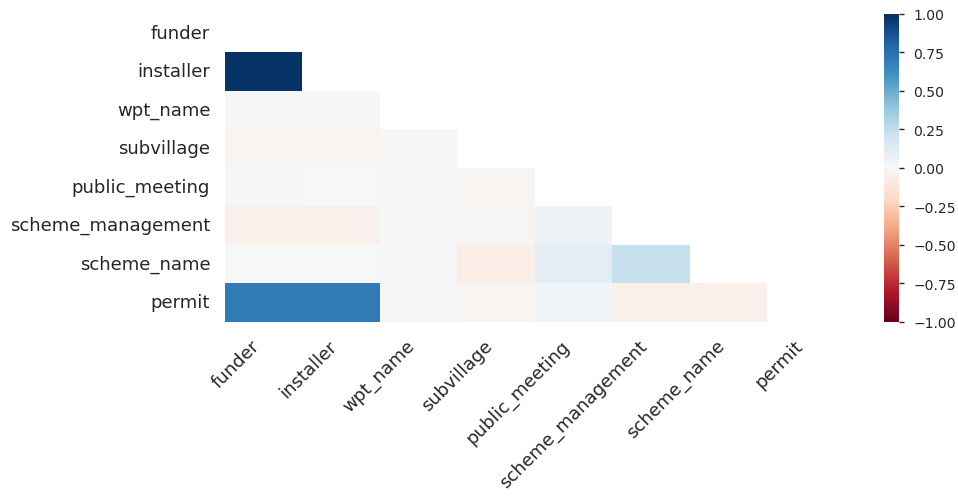

In [14]:
ydata_profiling.ProfileReport(train)

#### Análisis

- Las variables numericas no contienen datos perdidos pero es posible que los perdidos hayan sido codificados como valores cero. La variable "construction_year" tiene valores cero que son invalidos. Una busqueda en internet revela que los valores cero de las variables "longitude" y "latitude" también son invalidos. Tanzania no tiene partes donde el valor de "longitude" o "latitude" es cero. Tendré que comprobar si todos los ceros son validos.  

- Muchas de las variables categoricas tienen alta cardinalidad.

- Hay muchas variables parecidas. 

##### id

"id" es una etiqueta para cada bomba que no va a ayudar en la predicción. Lo elimino.   

##### amount_tsh

"Amount_tsh" tiene 98 valores distintos y 70% de los datos son ceros. Estos ceros pueden ser valores perdidos pero no podemos concluir cien por cien. Ademas, 70% es mucho para imputar. Observamos la distribución de las clases objetivas para estos valores ceros para ver si existe algún patrón. 

In [15]:
temp = train.copy()
temp['amount_tsh_missing'] = np.where( temp['amount_tsh']==0.0, 1, 0) 
 
distribution_checker(temp, 'amount_tsh_missing')

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
amount_tsh_missing,,,,,
0,17761.0,29.9,70.7,22.2,7.1
1,41639.0,70.1,47.3,45.4,7.3


Hay una frecuencia más alta de bombas de tipo "functional" para los valores de "amount_tsh" que no son "perdidos" o cero que la frecuencia para los valores cero. Vemos lo contrario para la frecuencia de bombas de tipo "non functional" para los valores de "amount_tsh" que son "perdidos". 

La frecuencia de "non functional" es más baja cuando hay presencia de "amount_tsh". Aunque no podemos concluir que los valores ceros son invalidos, hemos observado que un patron existe que intentaremos usar en nuestro modelo.

##### num_private

Esta variable contiene 65 valores distintos y 98,7% valores cero. Debido a la gran cantidad de ceros y 65 distintos, esta variable no contiene mucha información. Lo elimino.

##### population

"Popuation" contiene 21.381 ceros (36%). Observamos la distribución de esta variable. 

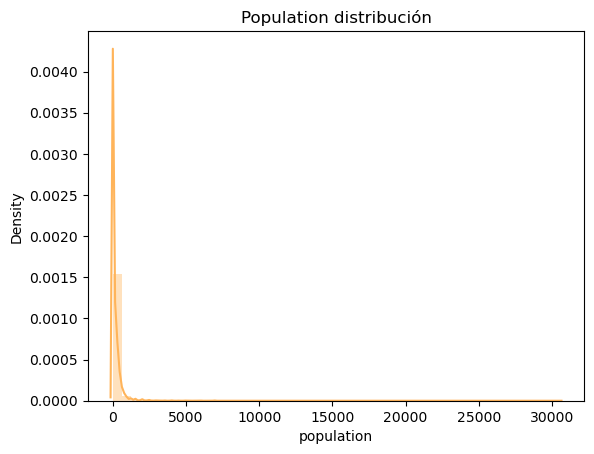

In [138]:
ax = sns.distplot( train[ 'population'], color = '#FFB45A')
ax.set(title = 'Population distribución')
plt.show()
     

Es claro que los valores perdidos han sido codificados como valores cero. La mayoria de los datos tiene valores en torno a 100 pero hay valores muy altos. Probablemente haya que escalar los datos en el futuro.

##### construction_year

La variable "construction_year" contiene valores cero que son invalidos. Ignorando estos valores cero, observamos una gráfico de la distribución de las clases objetivas por "construction_year" para ver si vemos un patrón.

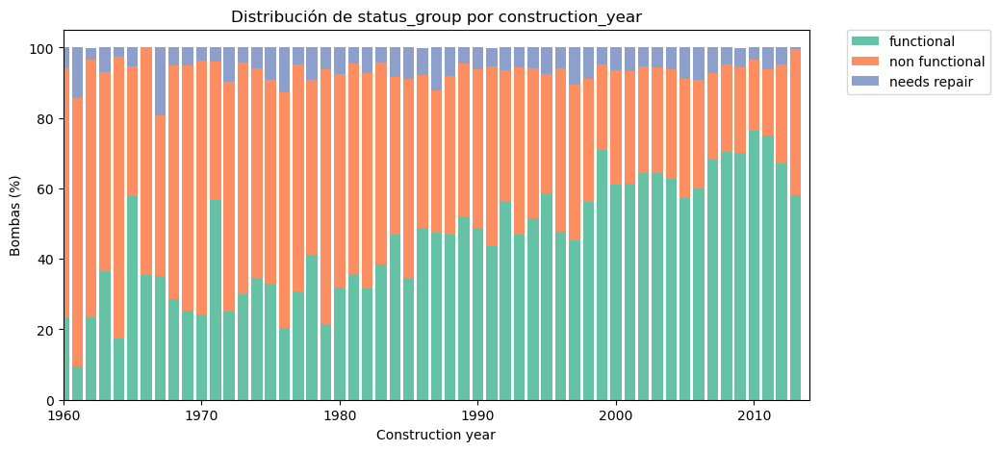

In [17]:
fig, ax = plt.subplots(figsize=(10,5))
construction = distribution_checker(train, 'construction_year')
labels = train['construction_year'].sort_values().unique()
ax.bar(labels, construction['perc_functional'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, construction['perc_non_functional'], label = 'non functional', bottom = construction['perc_functional'] , color = '#fc8e62')
ax.bar(labels, construction['perc_functional_needs_repair'], label = 'needs repair', bottom = construction['perc_functional'] + construction['perc_non_functional'],  color = '#8da0cb')
ax.set(title = 'Distribución de status_group por construction_year', xlabel = 'Construction year', ylabel = 'Bombas (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim([1960,2014])
plt.show()
     

Existe un patrón entre "construction_year" y a distribución de clases objetivas. La proporción de bombas tipo "functional" a bombas tipo "non functional" es más alta en "construction_year" más reciente. Cuando decidamos lo que hacer con los valores perdidos de "construction_year" será importante que consideremos este patrón. 

##### gps_height

"Gps_height" contiene 20.438 valores cero y valores por debajo de cero. Una búsqueda en internet revela que hay partes de Tanzania que están al nivel del mar pero no hay partes debajo este nivel. Por lo tanto, podemos concluir que los valores de "gps_height" que están por debajo de cero son invalidos pero no podemos concluir que los valores cero son invalidos. 

Usando las variables "longitude" y "latitude", creamos un gráfico que representa aproximadamente el mapa de Tanzania para ver donde están los valores cero. Suponemos que estos valores estén cerca de la costa, si observamos lo contrario, podemos concluir que los valores cero son valores perdidos.  

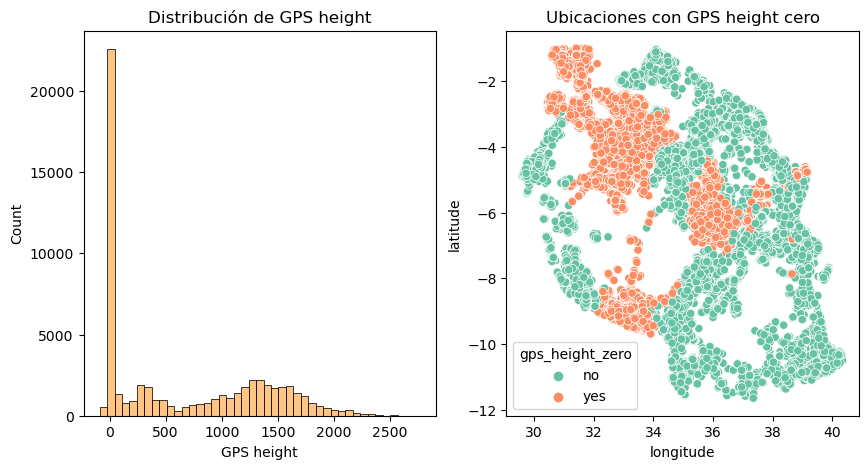

In [19]:
fig, axes = plt.subplots(1, 2,  figsize=(10,5))

#distribución de gps_height
sns.histplot( train[ 'gps_height'], color = '#FFB45A', ax=axes[0])
axes[0].set(title = 'Distribución de GPS height', xlabel = 'GPS height')

#trazar ubicaciones donde gps_height es cero
temp = train[train['longitude']!=0]#solo incluir puntos donde longitude no es cero. 
temp['gps_height_zero'] = np.where(temp['gps_height']==0, 'yes', 'no')
sns.scatterplot(x= temp['longitude'], y = temp['latitude'], hue = temp['gps_height_zero'], palette='Set2', ax = axes[1])
axes[1].set(title = 'Ubicaciones con GPS height cero', xlabel = 'longitude')

plt.show()
     

Como observamos en nuestro gráfico, los valores cero de "gps_height" se distribuyen por todo el país. Concluimos que estos valores son valores perdidos.

##### longitude

Una busqueda en internet revela que Tanzania no tiene partes donde "longitude" tendría el valor cero. Concluimos que estos valores cero son valores peridos.

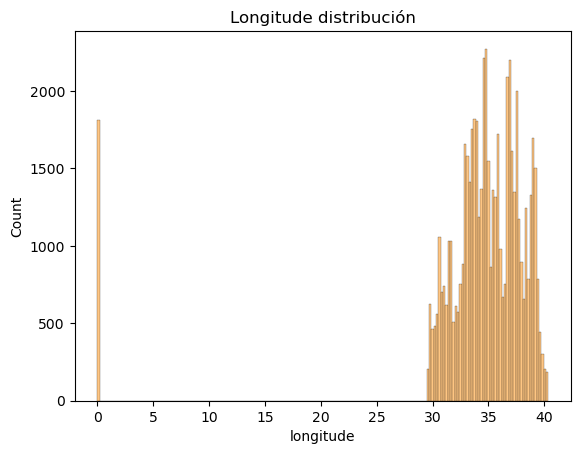

In [137]:
ax = sns.histplot( train[ 'longitude'], color = '#FFB45A')
ax.set(title = 'Longitude distribución')
plt.show()
     

##### latitude

Vemos que la variable "latitude" no tiene ceros. Hay 1.812 datos con un valor -2*10^-8 o basicamente cero. Una busqueda en internet revela que estos valores son invalidos.  


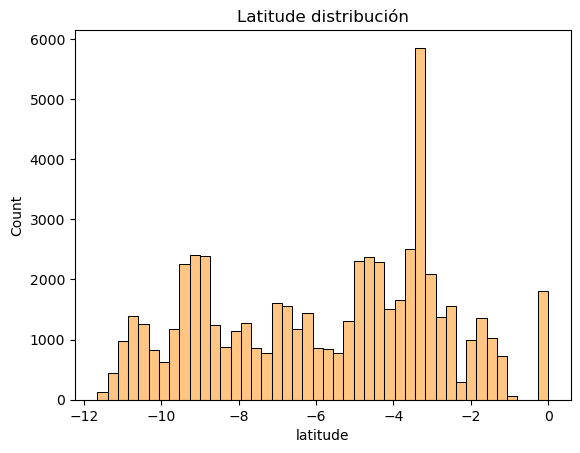

In [139]:
ax = sns.histplot( train[ 'latitude'], color = '#FFB45A')
ax.set(title = 'Latitude distribución')
plt.show()

##### basin

La variable "basin" tiene 9 valores distintos. Podemos usar la misma técnica que usamos para "gps_height" para visualizar la distribución de "basin".

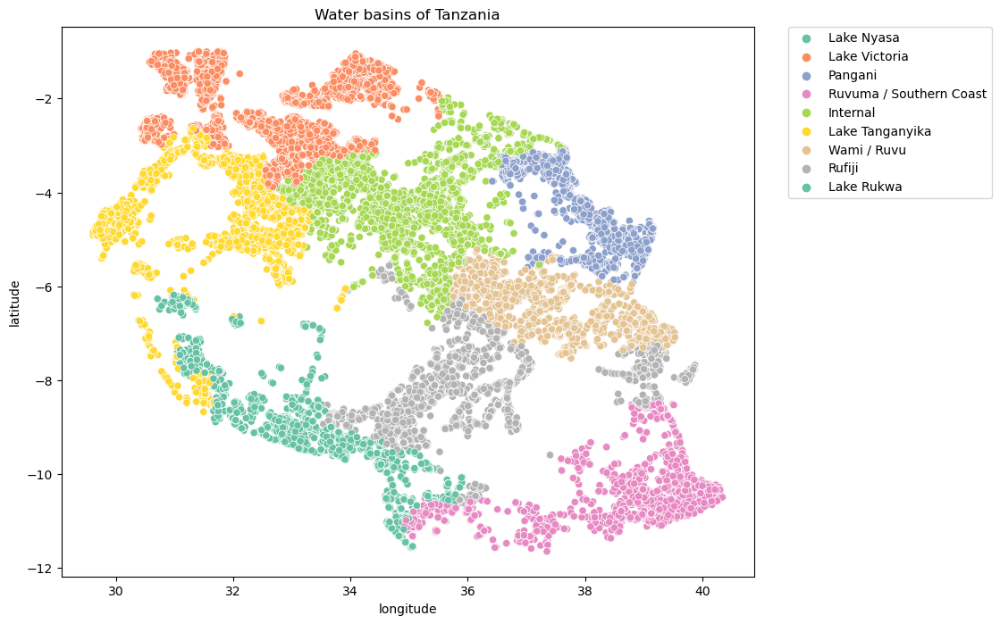

In [22]:
fig, axes = plt.subplots(  figsize=(10,8))
temp = train[train['longitude']!=0]  
temp['gps_height_zero'] = np.where(temp['gps_height']==0, 'yes', 'no')
ax = sns.scatterplot(x= temp['longitude'], y = temp['latitude'], hue = temp['basin'], palette='Set2')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set(title = 'Water basins of Tanzania')
plt.show()

In [23]:
basin = distribution_checker(train, 'basin')
basin = basin.sort_values('num_pumps', ascending= False)
basin.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
basin,,,,,
Lake Victoria,10248.0,17.3,49.8,40.6,9.7
Pangani,8940.0,15.1,60.1,34.6,5.3
Rufiji,7976.0,13.4,63.5,31.0,5.5
Internal,7785.0,13.1,57.6,35.3,7.2
Lake Tanganyika,6432.0,10.8,48.3,40.2,11.5
Wami / Ruvu,5987.0,10.1,52.4,43.1,4.5
Lake Nyasa,5085.0,8.6,65.4,29.7,4.9
Ruvuma / Southern Coast,4493.0,7.6,37.2,55.6,7.3
Lake Rukwa,2454.0,4.1,40.7,48.2,11.0


Observamos que hay categorías de "basin" en las que la proporción de bombas tipo "functional" es más alta. 

##### region

La variable "region" tiene 21 categorías.

In [24]:
region = train.groupby(['basin', 'region',])['id'].count().reset_index()
region.head(10)

,basin,region,id
0,Internal,Arusha,1309
1,Internal,Dodoma,827
2,Internal,Kilimanjaro,169
3,Internal,Manyara,1206
4,Internal,Shinyanga,1641
5,Internal,Singida,1992
6,Internal,Tabora,641
7,Lake Nyasa,Iringa,1582
8,Lake Nyasa,Mbeya,2430
9,Lake Nyasa,Ruvuma,1073


In [25]:
region = distribution_checker(train, 'region')
region = region.sort_values('num_pumps', ascending= False)
region.head(21)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
region,,,,,
Iringa,5294.0,8.9,78.2,19.5,2.3
Shinyanga,4982.0,8.4,56.0,31.3,12.7
Mbeya,4639.0,7.8,50.0,39.1,10.9
Kilimanjaro,4379.0,7.4,60.3,32.4,7.4
Morogoro,4006.0,6.7,52.9,39.6,7.5
Arusha,3350.0,5.6,68.5,26.3,5.2
Kagera,3316.0,5.6,52.1,38.8,9.2
Mwanza,3102.0,5.2,48.4,45.7,5.9
Kigoma,2816.0,4.7,48.4,30.2,21.4


Para cada categoría de "basin" puede haber más de una categoría de "region". En distintas categorías de "region" hay distintas proporciones de tipos de bombas. 

##### region_code

La variable "region_code" tiene 27 valores distintos. Está codificada como una variable numérica, pero debe ser categórica.

In [26]:
region_code = train.groupby(['region', 'region_code',])['id'].count().reset_index()
region_code.head(27)

,region,region_code,id
0,Arusha,2,3024
1,Arusha,24,326
2,Dar es Salaam,7,805
3,Dodoma,1,2201
4,Iringa,11,5294
5,Kagera,18,3316
6,Kigoma,16,2816
7,Kilimanjaro,3,4379
8,Lindi,8,300
9,Lindi,18,8


In [27]:
region_code = distribution_checker(train, 'region_code')
region_code = region_code.sort_values('num_pumps', ascending= False)
region_code.head(27)
     

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
region_code,,,,,
11,5300.0,8.9,78.2,19.5,2.3
17,5011.0,8.4,56.0,31.3,12.7
12,4639.0,7.8,50.0,39.1,10.9
3,4379.0,7.4,60.3,32.4,7.4
5,4040.0,6.8,53.1,39.4,7.4
18,3324.0,5.6,52.0,38.8,9.1
19,3047.0,5.1,48.2,46.0,5.8
2,3024.0,5.1,65.4,28.8,5.8
16,2816.0,4.7,48.4,30.2,21.4


Hay 21 distintas categorías de "region" y 27 de "region_code". "Region_code" contiene más información que "region" aunque algunas categorias contienen pocas bombas. Hay información muy interesante que podemos extraer de nuestros gráficos. "Region" "Shinyanga" tiene 56% bombas tipo "functional" pero uno de su "region_code" tiene 78,2% y el otro 43,6. "Region" "Arusha" tiene 68,5% bombas tipo "functional" pero una de su "region_code" 96,9% y el otro 65,4. 

Estas diferencias son muy interesantes.

##### district_code

"District_code" tiene 20 valores distintos.

In [28]:
district_code = train.groupby(['region', 'district_code',])['id'].count().reset_index()
district_code.head(10)

,region,district_code,id
0,Arusha,1,189
1,Arusha,2,1206
2,Arusha,3,109
3,Arusha,5,201
4,Arusha,6,310
5,Arusha,7,1009
6,Arusha,30,326
7,Dar es Salaam,1,93
8,Dar es Salaam,2,497
9,Dar es Salaam,3,215


In [29]:
district_code = distribution_checker(train, 'district_code')
district_code = district_code.sort_values('num_pumps', ascending= False)
district_code.head(20)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
district_code,,,,,
1,12203.0,20.5,53.7,35.7,10.5
2,11173.0,18.8,55.5,36.9,7.6
3,9998.0,16.8,49.5,43.5,7.0
4,8999.0,15.1,62.2,32.2,5.7
5,4356.0,7.3,56.9,38.6,4.5
6,4074.0,6.9,50.4,43.9,5.7
7,3343.0,5.6,60.2,33.4,6.4
8,1043.0,1.8,56.5,38.4,5.1
30,995.0,1.7,69.2,22.1,8.6


Más de una categoría de "region" puede tener la misma categoría de "district_code". 

Podríamos crear una nueva variable que intenta captar la relación entre "region" y "district_code".

##### lga

In [30]:
lga = train.groupby(['region', 'lga',])['id'].count().reset_index()
lga.head(10)

,region,lga,id
0,Arusha,Arusha Rural,1252
1,Arusha,Arusha Urban,63
2,Arusha,Karatu,326
3,Arusha,Longido,310
4,Arusha,Meru,1009
5,Arusha,Monduli,189
6,Arusha,Ngorongoro,201
7,Dar es Salaam,Ilala,497
8,Dar es Salaam,Kinondoni,93
9,Dar es Salaam,Temeke,215


Una categoría "region" contiene uno o más categorías "lga". Hay 125 categorías distintas de "lga". Esta alta cardinalidad será demasiado para nuestro modelo pero puede ser util para imputar nuestros valores perdidos de "gps_height", "population", "longitude" y "latitude". 

**nota**: Al final obtuve mejor resultados incluyendo "lga" en mi modelo.

##### ward

In [31]:
ward = train.groupby(['lga', 'ward'])['id'].count().reset_index()
ward.head(10)

,lga,ward,id
0,Arusha Rural,Bangata,33
1,Arusha Rural,Bwawani,37
2,Arusha Rural,Ilkiding'a,86
3,Arusha Rural,Kimnyaki,79
4,Arusha Rural,Kiranyi,115
5,Arusha Rural,Kisongo,33
6,Arusha Rural,Mateves,22
7,Arusha Rural,Mlangarini,92
8,Arusha Rural,Moivo,44
9,Arusha Rural,Moshono,44


Una categoría "lga" contiene uno o más categorías "ward". Hay 2.092 categorías distintas de "ward". Esta alta cardinalidad será demasiado para nuestro modelo pero puede ser util para imputar nuestros valores perdidos de "gps_height", "population", "longitude" y "latitude". 

##### subvillage

In [32]:
village= train.groupby(['lga', 'ward', 'subvillage'])['id'].count().reset_index()
village.head(10)

,lga,ward,subvillage,id
0,Arusha Rural,Bangata,Engikaleti,19
1,Arusha Rural,Bangata,Gwasei,1
2,Arusha Rural,Bangata,Kwaniche,5
3,Arusha Rural,Bangata,Lobolosi,1
4,Arusha Rural,Bangata,Ndukenyi,2
5,Arusha Rural,Bangata,Ngwasei,2
6,Arusha Rural,Bangata,Sanganani,2
7,Arusha Rural,Bangata,Sangananu,1
8,Arusha Rural,Bwawani,Buluga,1
9,Arusha Rural,Bwawani,Bwawani,3


Una categoría "ward" contiene uno o más categorías "subvillage". Hay 19.287 categorías distintas de "subvillage". Esta alta cardinalidad será demasiado para nuestro modelo pero puede ser útil para imputar nuestros valores perdidos de "gps_height", "population", "longitude" y "latitude". 

##### date_recorded

Se registró el estado de las bombas entre 2002 y 2013. Esta variable no muestra información inusual. La podemos usar para construir variables nuevas como la edad de las bombas cuando se registraron, el año y el mes de registro.

##### recorded_year

In [33]:
temp = train.copy()
temp['recorded_year'] = pd.DatetimeIndex(temp ['date_recorded']).year

recorded = distribution_checker(temp ,'recorded_year')
recorded
     

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
recorded_year,,,,,
2002,1.0,0.0,100.0,0.0,0.0
2004,30.0,0.1,33.3,63.3,3.3
2011,28674.0,48.3,56.6,37.1,6.3
2012,6424.0,10.8,48.7,45.7,5.6
2013,24271.0,40.9,53.2,38.0,8.8


La mayoria de registros son entre 2011 y 2013. No hay un efecto claro del año de registro en el estado de las bombas. No vamos a usar esta variable en nuestro modelo.

##### recorded_month

In [34]:
temp = train.copy()
temp['recorded_month'] = pd.DatetimeIndex(temp ['date_recorded']).month

recorded = distribution_checker(temp ,'recorded_month')
recorded

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
recorded_month,,,,,
1,6354.0,10.7,41.1,46.2,12.7
2,12402.0,20.9,55.2,37.3,7.5
3,17936.0,30.2,61.7,33.3,5.0
4,3970.0,6.7,51.6,37.3,11.0
5,336.0,0.6,60.1,36.9,3.0
6,346.0,0.6,78.0,19.4,2.6
7,6928.0,11.7,50.2,41.9,7.9
8,3364.0,5.7,51.1,41.4,7.5
9,328.0,0.6,65.2,31.7,3.0


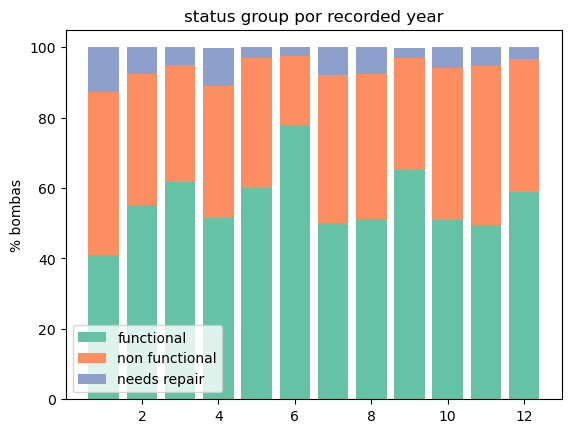

In [35]:
fig, ax = plt.subplots()
labels = temp['recorded_month'].sort_values().unique()
ax.bar(labels, recorded['perc_functional'], label = 'functional' ,  color = '#66c2a5')
ax.bar (labels, recorded['perc_non_functional'], label = 'non functional', bottom = recorded['perc_functional'] , color = '#fc8e62')
ax.bar(labels, recorded['perc_functional_needs_repair'], label = 'needs repair', bottom = recorded['perc_functional'] + recorded['perc_non_functional'], color = '#8da0cb')
ax.set_title('status group por recorded year')
ax.set_ylabel('% bombas')
plt.legend()
plt.show()
     

La mayoria de los registros ocurrieron en los primeros tres meses del año. Se registraron menos en los meses de mayo y junio pero no hay un patron muy claro en cuanto al estado de las bombas. No usaremos esta variable en el modelo.

##### funder

In [36]:
funder = distribution_checker(train, 'funder')
funder = funder.sort_values('num_pumps', ascending= False)
funder.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
funder,,,,,
Government Of Tanzania,9084.0,16.3,41.0,51.3,7.7
Danida,3114.0,5.6,55.0,39.9,5.1
Hesawa,2202.0,3.9,42.5,47.0,10.5
Rwssp,1374.0,2.5,58.6,33.5,7.9
World Bank,1349.0,2.4,40.4,52.4,7.2
Kkkt,1287.0,2.3,56.2,38.7,5.1
World Vision,1246.0,2.2,59.6,29.9,10.5
Unicef,1057.0,1.9,56.8,33.9,9.4
Tasaf,877.0,1.6,56.2,36.5,7.3


"Funder" tiene una cardinalidad muy alta con 1.896 categorías distintas. Observamos que hay diferencias en la distribución de estados que puede ser interesante. 

Tendremos que ver si hay una manera de incluir esta variable sin aumentar la dimensionalidad de nuestro conjunto de datos.

##### installer

In [37]:
installer = distribution_checker(train, 'installer')
installer = installer.sort_values('num_pumps', ascending= False)
installer.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
installer,,,,,
DWE,17402.0,31.2,54.2,36.5,9.3
Government,1825.0,3.3,29.3,56.7,14.0
RWE,1206.0,2.2,25.2,63.4,11.4
Commu,1060.0,1.9,68.3,28.7,3.0
DANIDA,1050.0,1.9,51.6,40.5,7.9
KKKT,898.0,1.6,47.0,46.1,6.9
Hesawa,840.0,1.5,56.5,41.4,2.0
0,777.0,1.4,57.3,42.3,0.4
TCRS,707.0,1.3,41.0,53.0,5.9


Vemos lo mismo con "installer" que tiene 2.145 categorías distintas. Hay diferencias interesantes en la distribución del estado de las bombas entre las categorias de "installer" pero existe el problema de alta cardinalidad.

##### wpt_name

In [38]:
name = distribution_checker(train, 'wpt_name')
name= name.sort_values('num_pumps', ascending= False)
name.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
wpt_name,,,,,
none,3563.0,6.0,73.8,24.1,2.1
Shuleni,1748.0,2.9,49.1,42.7,8.2
Zahanati,830.0,1.4,51.8,38.8,9.4
Msikitini,535.0,0.9,49.2,42.6,8.2
Kanisani,323.0,0.5,48.0,45.5,6.5
Bombani,271.0,0.5,58.3,33.9,7.7
Sokoni,260.0,0.4,46.2,43.8,10.0
Ofisini,254.0,0.4,43.3,52.4,4.3
School,208.0,0.4,41.8,51.9,6.2


"Wpt_name" tiene muy alta cardinalidad con 37.399 categorías distintas. La categoría más comun es "None". El nombre de la bomba no tiene relación con su estado. Quitamos "wpt_name".

##### public_meeting

In [39]:
meeting = distribution_checker(train, 'public_meeting')
meeting.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
public_meeting,,,,,
False,5055.0,9.0,43.0,48.3,8.7
True,51011.0,91.0,55.7,37.0,7.3


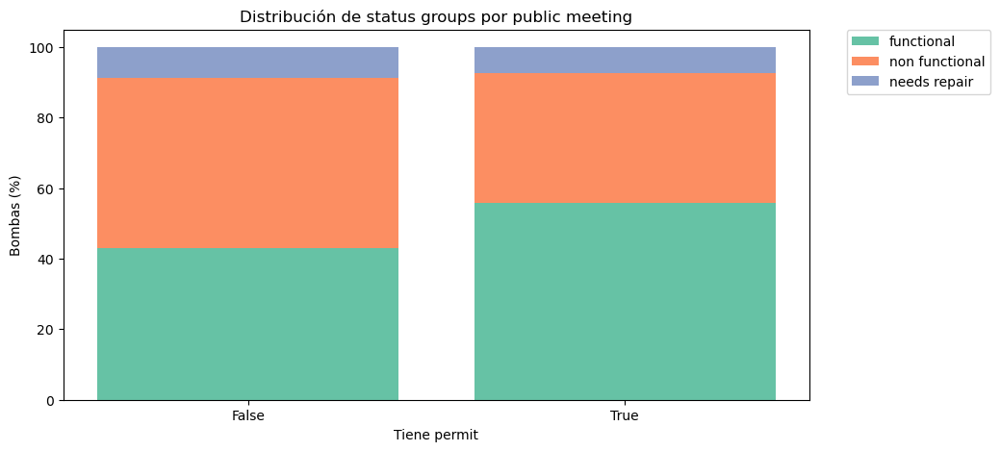

In [41]:
fig, ax = plt.subplots(figsize=(10,5))
permit = distribution_checker(train, 'public_meeting')
labels = ['False', 'True']
ax.bar(labels, permit['perc_functional'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, permit ['perc_non_functional'], label = 'non functional', bottom = permit['perc_functional'] , color = '#fc8e62')
ax.bar(labels, permit ['perc_functional_needs_repair'], label = 'needs repair', bottom = permit['perc_functional'] + permit['perc_non_functional'],  color = '#8da0cb')
ax.set(title = 'Distribución de status groups por public meeting', xlabel = 'Tiene permit', ylabel = 'Bombas (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

La mayoria de las bombas son de tipo "public_meeting". Bombas que son de este tipo tienen una proporción de bombas tipo "functional" más alta. 

##### recorded_by

Esta variable solo tiene un valor distinto. Lo quitamos.

##### permit

In [42]:
permit = distribution_checker(train, 'permit')
permit.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
permit,,,,,
False,17492.0,31.0,51.7,40.7,7.5
True,38852.0,69.0,55.4,37.6,6.9


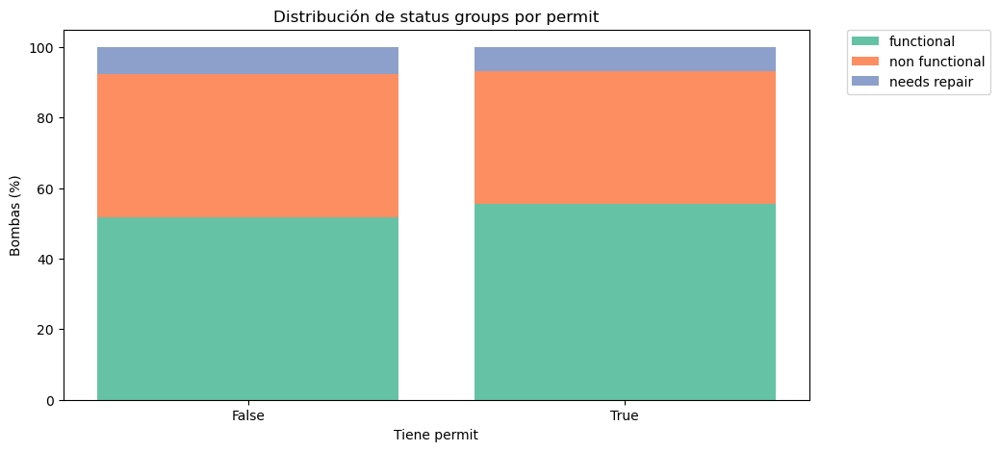

In [43]:
fig, ax = plt.subplots(figsize=(10,5))
permit = distribution_checker(train, 'permit')
labels = ['False', 'True']
ax.bar(labels, permit['perc_functional'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, permit ['perc_non_functional'], label = 'non functional', bottom = permit['perc_functional'] , color = '#fc8e62')
ax.bar(labels, permit ['perc_functional_needs_repair'], label = 'needs repair', bottom = permit['perc_functional'] + permit['perc_non_functional'],  color = '#8da0cb')
ax.set(title = 'Distribución de status groups por permit', xlabel = 'Tiene permit', ylabel = 'Bombas (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

La mayoria de las bombas fueron construidas con un "permit". La distribución del estado de bomba no cambia mucho entre bombas que tienen un "permit" y las que no lo tienen. Esta variable no será muy importante en la predicción del estado.

##### extraction_type_class

In [44]:
extraction_class = distribution_checker(train, 'extraction_type_class')
extraction_class = extraction_class.sort_values('num_pumps', ascending= False)
extraction_class.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
extraction_type_class,,,,,
gravity,26780.0,45.1,59.9,30.0,10.1
handpump,16456.0,27.7,63.0,30.9,6.0
other,6430.0,10.8,16.0,80.8,3.2
submersible,6179.0,10.4,53.9,42.0,4.1
motorpump,2987.0,5.0,38.0,57.4,4.6
rope pump,451.0,0.8,65.0,31.3,3.8
wind-powered,117.0,0.2,42.7,51.3,6.0


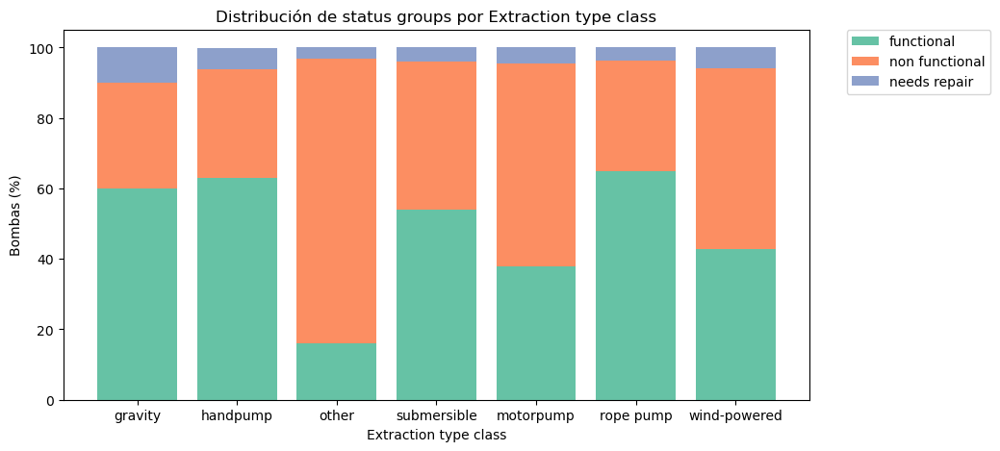

In [45]:
fig, ax = plt.subplots(figsize=(10,5))
labels = labels = extraction_class.index
ax.bar(labels, extraction_class['perc_functional'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, extraction_class['perc_non_functional'], label = 'non functional', bottom = extraction_class['perc_functional'] , color = '#fc8e62')
ax.bar(labels, extraction_class['perc_functional_needs_repair'], label = 'needs repair', bottom = extraction_class['perc_functional'] + extraction_class['perc_non_functional'],  color = '#8da0cb')
ax.set(title = 'Distribución de status groups por Extraction type class', xlabel = 'Extraction type class', ylabel = 'Bombas (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()
     

"Extraction_type_class" tiene 7 categorías distintas. Categoría "gravity" es la más comun con 26.780 datos. Hay una evidente diferencia en la distribución de estado pero algunas categorias no tienen muchos datos.

##### extraction_type_group

In [46]:
train.groupby(['extraction_type_class', 'extraction_type_group'])['id'].count().reset_index()
     

,extraction_type_class,extraction_type_group,id
0,gravity,gravity,26780
1,handpump,afridev,1770
2,handpump,india mark ii,2400
3,handpump,india mark iii,98
4,handpump,nira/tanira,8154
5,handpump,other handpump,364
6,handpump,swn 80,3670
7,motorpump,mono,2865
8,motorpump,other motorpump,122
9,other,other,6430


In [47]:
extraction_group = distribution_checker(train, 'extraction_type_group')
extraction_group  = extraction_group .sort_values('num_pumps', ascending= False)
extraction_group.head(13)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
extraction_type_group,,,,,
gravity,26780.0,45.1,59.9,30.0,10.1
nira/tanira,8154.0,13.7,66.5,25.7,7.9
other,6430.0,10.8,16.0,80.8,3.2
submersible,6179.0,10.4,53.9,42.0,4.1
swn 80,3670.0,6.2,56.9,37.3,5.8
mono,2865.0,4.8,37.8,57.7,4.5
india mark ii,2400.0,4.0,60.3,36.4,3.3
afridev,1770.0,3.0,67.8,29.8,2.4
rope pump,451.0,0.8,65.0,31.3,3.8


"Extraction_type_group" tiene más información que "extraction_type_class" con 12 categorías distintas. Para cada categoría de "extraction_type_class", puede haber una o más categorías de "extracton_type_group". Cuanto más dividiamos los datos en categorías, mas categorías no contendran muchos datos.

##### extraction_type

In [48]:
train.groupby(['extraction_type_class', 'extraction_type_group', 'extraction_type'])['id'].count().reset_index()   

,extraction_type_class,extraction_type_group,extraction_type,id
0,gravity,gravity,gravity,26780
1,handpump,afridev,afridev,1770
2,handpump,india mark ii,india mark ii,2400
3,handpump,india mark iii,india mark iii,98
4,handpump,nira/tanira,nira/tanira,8154
5,handpump,other handpump,other - mkulima/shinyanga,2
6,handpump,other handpump,other - play pump,85
7,handpump,other handpump,other - swn 81,229
8,handpump,other handpump,walimi,48
9,handpump,swn 80,swn 80,3670


In [49]:
extraction_type= distribution_checker(train, 'extraction_type')
extraction_type = extraction_type.sort_values('num_pumps', ascending= False)
extraction_type

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
extraction_type,,,,,
gravity,26780.0,45.1,59.9,30.0,10.1
nira/tanira,8154.0,13.7,66.5,25.7,7.9
other,6430.0,10.8,16.0,80.8,3.2
submersible,4764.0,8.0,55.1,40.1,4.8
swn 80,3670.0,6.2,56.9,37.3,5.8
mono,2865.0,4.8,37.8,57.7,4.5
india mark ii,2400.0,4.0,60.3,36.4,3.3
afridev,1770.0,3.0,67.8,29.8,2.4
ksb,1415.0,2.4,49.7,48.5,1.8


"Extraction_type" tiene más información que las otras variables de extraction con 18 categorías distintas. El problema es que los datos han sidos dividos mas y ahora hay categorías como "other-mkulima/shinynaga" que solo contiene dos datos. Tendremos que decidir lo que vamos a hacer con esto. 

Podemos agrupar categorías con pocos datos o solo usar la variable "extraction_type_class" que tiene la menor cantidad de información pero cuyas categorías contienen datos suficientes.

**nota** Al final, he mantenido "extraction_type" y quité "extraction_type_group".

##### management_group

In [50]:
management_group = distribution_checker(train, 'management_group')
management_group = management_group.sort_values('num_pumps', ascending= False)
management_group.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
management_group,,,,,
user-group,52490.0,88.4,53.8,38.7,7.4
commercial,3638.0,6.1,61.4,35.3,3.2
parastatal,1768.0,3.0,57.7,30.4,11.9
other,943.0,1.6,56.0,38.1,5.9
unknown,561.0,0.9,39.9,55.3,4.8


"Management_group" tiene 5 categorías distintas. La mayoria de bombas son de tipo "user-group". Podemos ver que bombas de tipo "parastatal" tienen mayor proporción de ser de tipo "needs repair".

##### scheme_management

In [51]:
scheme_management = train.groupby(['management_group', 'scheme_management' ])['id'].count().reset_index()
scheme_management.head(10)

,management_group,scheme_management,id
0,commercial,Company,898
1,commercial,Other,84
2,commercial,Parastatal,60
3,commercial,Private operator,971
4,commercial,Trust,64
5,commercial,VWC,172
6,commercial,WUA,196
7,commercial,WUG,11
8,commercial,Water Board,6
9,commercial,Water authority,1053


In [52]:
scheme = distribution_checker(train, 'scheme_management')
scheme = scheme.sort_values('num_pumps', ascending= False)
scheme.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
scheme_management,,,,,
VWC,36793.0,66.3,51.5,42.1,6.3
WUG,5206.0,9.4,57.7,29.4,12.9
Water authority,3153.0,5.7,51.3,34.5,14.2
WUA,2883.0,5.2,69.2,22.5,8.3
Water Board,2748.0,4.9,74.7,21.3,4.0
Parastatal,1680.0,3.0,57.5,30.5,12.0
Private operator,1063.0,1.9,68.6,29.3,2.2
Company,1061.0,1.9,50.3,46.2,3.5
Other,766.0,1.4,59.8,37.3,2.9


"Scheme_management" tiene más información que "management_group" con 11 categorías. Cada categoría de "management_group" tiene uno o más categorías de "scheme_management". La mayoria de bombas son de "scheme_management" categoría "VWC". Vemos que hay una diferencia en la proporción de bombas tipo "functional" entre las distintas categorías. Quitamos "managment_group" y mantenemos "scheme_managment".

##### management

In [53]:
management = train.groupby(['management_group', 'scheme_management' , 'management'])['id'].count().reset_index()
management.head(10)

,management_group,scheme_management,management,id
0,commercial,Company,company,674
1,commercial,Company,private operator,224
2,commercial,Other,private operator,64
3,commercial,Other,trust,1
4,commercial,Other,water authority,19
5,commercial,Parastatal,private operator,59
6,commercial,Parastatal,water authority,1
7,commercial,Private operator,company,2
8,commercial,Private operator,private operator,963
9,commercial,Private operator,trust,1


In [54]:
management = distribution_checker(train, 'management')
management= management.sort_values('num_pumps', ascending= False)
management.head(12)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
management,,,,,
vwc,40507.0,68.2,50.4,42.7,6.9
wug,6515.0,11.0,60.0,30.1,9.9
water board,2933.0,4.9,74.0,17.0,9.0
wua,2535.0,4.3,69.1,22.8,8.1
private operator,1971.0,3.3,74.9,22.9,2.2
parastatal,1768.0,3.0,57.7,30.4,11.9
water authority,904.0,1.5,49.3,44.9,5.8
other,844.0,1.4,59.8,33.6,6.5
company,685.0,1.2,39.0,58.8,2.2


"Management" tiene 12 categorías distintas. No es clara su relación con "scheme_managment". Tendremos que decidir lo que hacer con esta variable.

**nota** Al final, quité "management".

##### scheme_name

In [55]:
scheme_name = distribution_checker(train, 'scheme_name')
scheme_name= scheme_name.sort_values('num_pumps', ascending= False)
scheme_name.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
scheme_name,,,,,
K,682.0,2.2,55.1,28.0,16.9
Borehole,546.0,1.8,37.4,57.9,4.8
Chalinze wate,405.0,1.3,85.9,14.1,0.0
M,400.0,1.3,49.2,36.8,14.0
DANIDA,379.0,1.2,52.5,43.0,4.5
Government,320.0,1.0,46.9,43.1,10.0
Ngana water supplied scheme,270.0,0.9,25.9,72.6,1.5
wanging'ombe water supply s,261.0,0.9,63.2,18.8,18.0
wanging'ombe supply scheme,234.0,0.8,62.4,27.4,10.3


"Scheme_name" tiene 2.695 categorías distintas y 48,5% valores perdidos. Esta variable no será muy útil en nuesta predicción debido a la gran cantidad de valores perdidos y la alta cardinalidad. La eliminamos.

##### payment

In [56]:
payment = distribution_checker(train, 'payment')
payment  = payment .sort_values('num_pumps', ascending= False)
payment.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
payment,,,,,
never pay,25348.0,42.7,44.9,47.6,7.5
pay per bucket,8985.0,15.1,67.8,27.7,4.6
pay monthly,8300.0,14.0,66.0,22.8,11.2
unknown,8157.0,13.7,43.3,51.5,5.3
pay when scheme fails,3914.0,6.6,62.1,30.9,7.1
pay annually,3642.0,6.1,75.2,18.0,6.8
other,1054.0,1.8,58.0,30.8,11.2


"Payment" tiene 7 categorías distintas. Contiene la misma información que "payment_type". Quitamos "payment" y nos quedamos con "payment_type".

##### payment_type

In [57]:
payment = distribution_checker(train, 'payment_type')
payment

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
payment_type,,,,,
annually,3642.0,6.1,75.2,18.0,6.8
monthly,8300.0,14.0,66.0,22.8,11.2
never pay,25348.0,42.7,44.9,47.6,7.5
on failure,3914.0,6.6,62.1,30.9,7.1
other,1054.0,1.8,58.0,30.8,11.2
per bucket,8985.0,15.1,67.8,27.7,4.6
unknown,8157.0,13.7,43.3,51.5,5.3


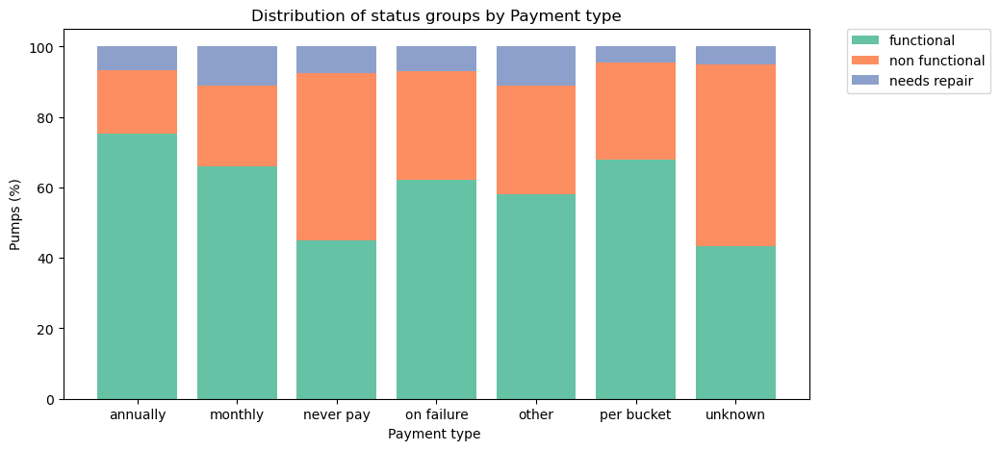

In [58]:
fig, ax = plt.subplots(figsize=(10,5))
payment = distribution_checker(train, 'payment_type')
labels = train['payment_type'].sort_values().unique()
ax.bar(labels, payment ['perc_functional'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, payment ['perc_non_functional'], label = 'non functional', bottom = payment ['perc_functional'] , color = '#fc8e62')
ax.bar(labels, payment ['perc_functional_needs_repair'], label = 'needs repair', bottom = payment ['perc_functional'] + payment ['perc_non_functional'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by Payment type', xlabel = 'Payment type ', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

La mayoria de la bombas son gratis. Vemos que en las bombas que requieren pago, hay una mejor proporción de tipo "functional".

##### quality_group

In [59]:
quality_group = distribution_checker(train, 'quality_group')
quality_group  = quality_group.sort_values('num_pumps', ascending= False)
quality_group .head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
quality_group,,,,,
good,50818.0,85.6,56.6,35.7,7.7
salty,5195.0,8.7,46.1,48.2,5.7
unknown,1876.0,3.2,14.1,84.1,1.9
milky,804.0,1.4,54.5,43.8,1.7
colored,490.0,0.8,50.2,38.8,11.0
fluoride,217.0,0.4,72.4,21.7,6.0


"Quality_group" tiene seis categorías. La mayoria de las bombas son de tipo "good".

##### water_quality

In [60]:
train.groupby(['quality_group', 'water_quality'])['id'].count().reset_index()

,quality_group,water_quality,id
0,colored,coloured,490
1,fluoride,fluoride,200
2,fluoride,fluoride abandoned,17
3,good,soft,50818
4,milky,milky,804
5,salty,salty,4856
6,salty,salty abandoned,339
7,unknown,unknown,1876


In [61]:
water_quality = distribution_checker(train, 'water_quality')
water_quality  = water_quality.sort_values('num_pumps', ascending= False)
water_quality.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
water_quality,,,,,
soft,50818.0,85.6,56.6,35.7,7.7
salty,4856.0,8.2,45.7,49.6,4.6
unknown,1876.0,3.2,14.1,84.1,1.9
milky,804.0,1.4,54.5,43.8,1.7
coloured,490.0,0.8,50.2,38.8,11.0
salty abandoned,339.0,0.6,51.3,27.4,21.2
fluoride,200.0,0.3,75.5,18.0,6.5
fluoride abandoned,17.0,0.0,35.3,64.7,0.0


"Water_quality" tiene ocho categorías distintas. La categoría "fluoride" esta dividida en "fluoride" y "fluoride abandoned" y "salty" esta dividida en "salty" y "salty abandoned". La categoría "fluoride" abandoned solo tiene 17 bombas. Aunque la variable "water_quality" contiene más información que "quality_group", algunas categorías nuevas contienen pocos datos. Ademas, quitamos "quality_group" y mantenemos "water_quality".

##### quantity_group

In [62]:
quantity_group = distribution_checker(train, 'quantity_group')
quantity_group  = quantity_group.sort_values('num_pumps', ascending= False)
quantity_group.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
quantity_group,,,,,
enough,33186.0,55.9,65.2,27.5,7.2
insufficient,15129.0,25.5,52.3,38.1,9.6
dry,6246.0,10.5,2.5,96.9,0.6
seasonal,4050.0,6.8,57.4,32.3,10.3
unknown,789.0,1.3,27.0,71.2,1.8


"Quantity_group" contiene 5 categorías y la misma información que "quantity". Quitamos "quantity_group" y nos quedamos con "quantity".

##### quantity

In [63]:
train.groupby(['quantity_group', 'quantity' ])['id'].count().reset_index()

,quantity_group,quantity,id
0,dry,dry,6246
1,enough,enough,33186
2,insufficient,insufficient,15129
3,seasonal,seasonal,4050
4,unknown,unknown,789


In [64]:
quantity= distribution_checker(train, 'quantity')
quantity  = quantity.sort_values('num_pumps', ascending= False)
quantity.head(10)  

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
quantity,,,,,
enough,33186.0,55.9,65.2,27.5,7.2
insufficient,15129.0,25.5,52.3,38.1,9.6
dry,6246.0,10.5,2.5,96.9,0.6
seasonal,4050.0,6.8,57.4,32.3,10.3
unknown,789.0,1.3,27.0,71.2,1.8


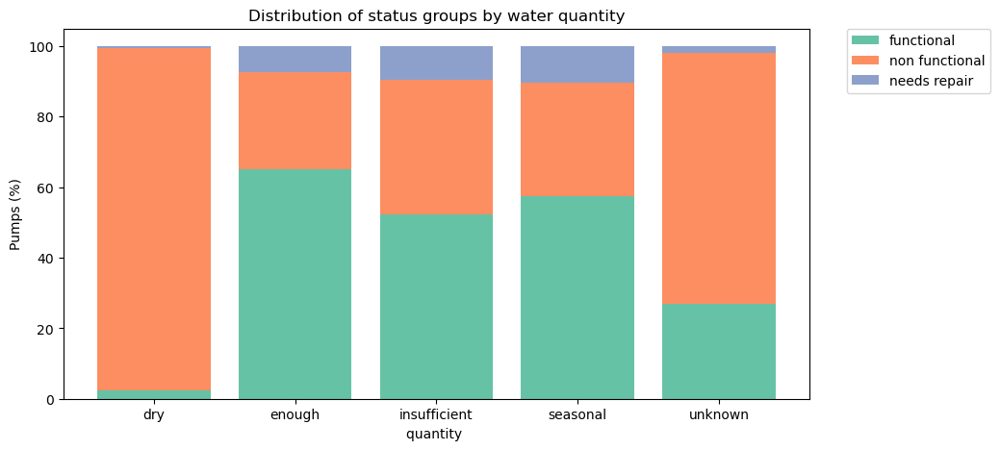

In [65]:
fig, ax = plt.subplots(figsize=(10,5))
quantity = distribution_checker(train, 'quantity')
labels = train['quantity'].sort_values().unique()
ax.bar(labels, quantity ['perc_functional'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, quantity ['perc_non_functional'], label = 'non functional', bottom = quantity ['perc_functional'] , color = '#fc8e62')
ax.bar(labels, quantity ['perc_functional_needs_repair'], label = 'needs repair', bottom = quantity ['perc_functional'] + quantity ['perc_non_functional'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by water quantity', xlabel = 'quantity ', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

La mayoria de bombas de tipo "dry" son de tipo "non-functional". Creo que esta variable será muy útil en la predicción.

##### source_class

In [66]:
source_class = distribution_checker(train, 'source_class')
source_class  = source_class.sort_values('num_pumps', ascending= False)
source_class.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
source_class,,,,,
groundwater,45794.0,77.1,54.2,39.8,6.0
surface,13328.0,22.4,54.5,33.7,11.8
unknown,278.0,0.5,56.8,41.4,1.8


"Source_class" contiene 3 categorías. La mayoria de bombas son de tipo "groundwater". Categoría "surface" tiene una proporción más alta de "functional needs repair".  

##### source_type

In [67]:
train.groupby(['source_class', 'source_type' ])['id'].count().reset_index()

,source_class,source_type,id
0,groundwater,borehole,11949
1,groundwater,shallow well,16824
2,groundwater,spring,17021
3,surface,dam,656
4,surface,rainwater harvesting,2295
5,surface,river/lake,10377
6,unknown,other,278


In [68]:
source_type = distribution_checker(train, 'source_type')
source_type = source_type.sort_values('num_pumps', ascending= False)
source_type.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
source_type,,,,,
spring,17021.0,28.7,62.2,30.3,7.5
shallow well,16824.0,28.3,49.5,44.8,5.7
borehole,11949.0,20.1,49.5,46.2,4.3
river/lake,10377.0,17.5,54.2,33.9,11.9
rainwater harvesting,2295.0,3.9,60.4,25.9,13.7
dam,656.0,1.1,38.6,57.8,3.7
other,278.0,0.5,56.8,41.4,1.8


"Source_type" tiene más información que "source_class" con 7 categorías. La proporción de bombas tipo "functional" es más alta en la categoría "spring" que en las dos otras categorías de categoria "groundwater". Vemos lo mismo con la categoría "rainwater harvesting" de categoría "surface". 

##### source

In [69]:
train.groupby(['source_class', 'source_type', 'source' ])['id'].count().reset_index()

,source_class,source_type,source,id
0,groundwater,borehole,hand dtw,874
1,groundwater,borehole,machine dbh,11075
2,groundwater,shallow well,shallow well,16824
3,groundwater,spring,spring,17021
4,surface,dam,dam,656
5,surface,rainwater harvesting,rainwater harvesting,2295
6,surface,river/lake,lake,765
7,surface,river/lake,river,9612
8,unknown,other,other,212
9,unknown,other,unknown,66


In [70]:
source = distribution_checker(train, 'source')
source = source.sort_values('num_pumps', ascending= False)
source.head(12)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
source,,,,,
spring,17021.0,28.7,62.2,30.3,7.5
shallow well,16824.0,28.3,49.5,44.8,5.7
machine dbh,11075.0,18.6,49.0,46.6,4.4
river,9612.0,16.2,56.9,30.4,12.7
rainwater harvesting,2295.0,3.9,60.4,25.9,13.7
hand dtw,874.0,1.5,56.9,41.2,1.9
lake,765.0,1.3,21.2,77.3,1.6
dam,656.0,1.1,38.6,57.8,3.7
other,212.0,0.4,59.4,40.1,0.5


"Source" tiene 10 categorías. Las categorías "borehole", "river/lake" y "other" han sido divididas en dos categorías. Vemos que la nueva categoría "lake" tiene una mayor proporción de bombas tipo "non functional" que la categoría "river". Aunque una categorías contienen pocos datos, la información contenida dentro de esta variable es interesante. 

Vamos a quitar "source_class" y "source_type" y mantener "source".

##### waterpoint_type_group

In [71]:
waterpoint_type_group = distribution_checker(train, 'waterpoint_type_group')
waterpoint_type_group = waterpoint_type_group.sort_values('num_pumps', ascending= False)
waterpoint_type_group.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
waterpoint_type_group,,,,,
communal standpipe,34625.0,58.3,57.6,34.0,8.4
hand pump,17488.0,29.4,61.8,32.3,5.9
other,6380.0,10.7,13.2,82.2,4.6
improved spring,784.0,1.3,71.8,17.3,10.8
cattle trough,116.0,0.2,72.4,25.9,1.7
dam,7.0,0.0,85.7,14.3,0.0


"Waterpoint_type_group" tiene 6 categorías. La mayoria de las bombas son de tipo "communal standpipe".

##### waterpoint_type

In [72]:
train.groupby(['waterpoint_type_group',  'waterpoint_type' ])['id'].count().reset_index()

,waterpoint_type_group,waterpoint_type,id
0,cattle trough,cattle trough,116
1,communal standpipe,communal standpipe,28522
2,communal standpipe,communal standpipe multiple,6103
3,dam,dam,7
4,hand pump,hand pump,17488
5,improved spring,improved spring,784
6,other,other,6380


In [73]:
waterpoint_type = distribution_checker(train, 'waterpoint_type')
waterpoint_type = waterpoint_type.sort_values('num_pumps', ascending= False)
waterpoint_type.head(10)

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
waterpoint_type,,,,,
communal standpipe,28522.0,48.0,62.1,29.9,7.9
hand pump,17488.0,29.4,61.8,32.3,5.9
other,6380.0,10.7,13.2,82.2,4.6
communal standpipe multiple,6103.0,10.3,36.6,52.8,10.6
improved spring,784.0,1.3,71.8,17.3,10.8
cattle trough,116.0,0.2,72.4,25.9,1.7
dam,7.0,0.0,85.7,14.3,0.0


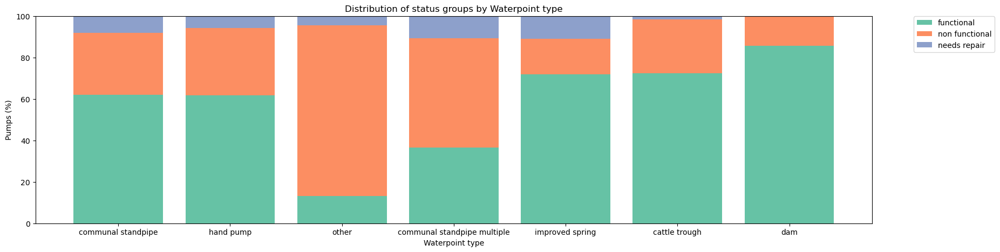

In [74]:
fig, ax = plt.subplots(figsize=(20,5))
labels = waterpoint_type.index
ax.bar(labels, waterpoint_type['perc_functional'], label = 'functional',  color = '#66c2a5')
ax.bar (labels, waterpoint_type['perc_non_functional'], label = 'non functional', bottom = waterpoint_type['perc_functional'] , color = '#fc8e62')
ax.bar(labels, waterpoint_type['perc_functional_needs_repair'], label = 'needs repair', bottom = waterpoint_type['perc_functional'] +waterpoint_type['perc_non_functional'],  color = '#8da0cb')
ax.set(title = 'Distribution of status groups by Waterpoint type', xlabel = 'Waterpoint type', ylabel = 'Pumps (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

"Waterpoint_type" tiene 7 categorías y es muy parecida a "waterpoint_type_group". La categoria "communal standpoint" ha sido dividida en dos categorías. Las dos nuevas categorías muestran información útil. "Communal standpoint multiple" tiene una proporción de bombas de tipo "functional" más alta que "communal standpoint". 

Quitamos "waterpoint_type_group" y nos quedamos con "waterpoint_type".

### Data Cleaning & Feature Engineering

##### Missing Values

In [75]:
#convertir los valores ceros en nulos en las variables en las que no son válidos
zero_converter = ['amount_tsh', 'gps_height', 'longitude', 'population', 'construction_year']

**nota** hemos convertido los ceros de "amount_tsh" en nulos para utilzar en la creación de una variable nueva. No vamos a imputar "amount_tsh" debido a la gran cantidad de ceros y al echo de que no estamos seguros de que sean inválidos.

In [76]:
def zero_nan(df, columns):
    df_copy = df.copy()
    for col in columns:
        df_copy[col] = df_copy[col].replace(0, np.nan)
    
    return df_copy

In [77]:
all = zero_nan(all, zero_converter)

In [78]:
#convertir los valores negativos en nulos
all['gps_height'] = all['gps_height'].where(all['gps_height'] >0)

In [79]:
#convertir los valores con valor -2*10^-8 en nulos
all['latitude'] = all['latitude'].where(all['latitude'] < -0.1, np.nan)

In [80]:
missing = round((all.isna().sum())/len(all)*100,1)
missing = missing.sort_values(ascending = False)
missing.head(15)

amount_tsh           70.1
scheme_name          48.6
gps_height           37.1
population           36.1
construction_year    35.0
status_group         20.0
scheme_management     6.5
funder                6.1
installer             6.1
public_meeting        5.6
permit                5.1
latitude              3.1
longitude             3.1
subvillage            0.6
source_type           0.0
dtype: float64

<Axes: >

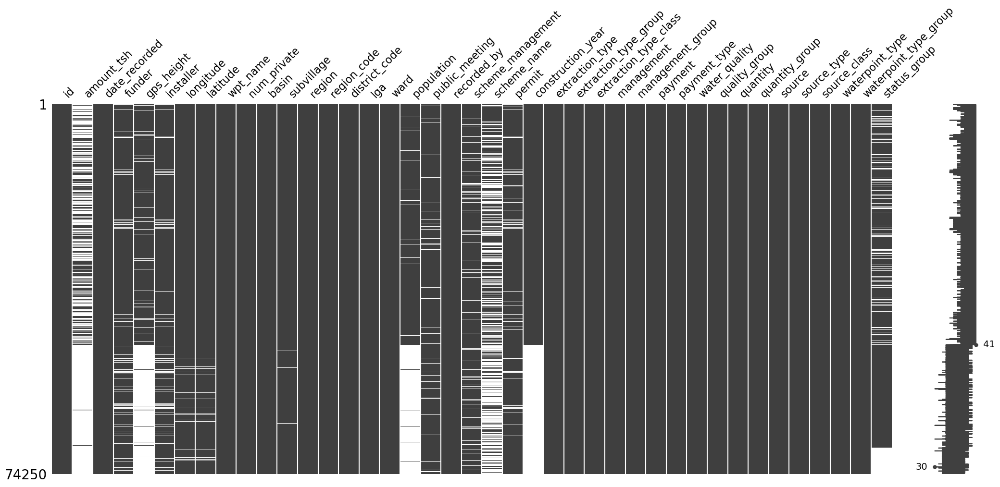

In [81]:
sorted =all.sort_values('construction_year')
msno.matrix(sorted)

Los valores nulos no se producen al azar. Esto en importante en cuanto a la decisión de qué método de imputación utilizar. La imputación por la media no es una buena solución aquí, ya que este método de imputación solo debe utilizarse cuando los datos faltan completamente al azar. Cuando falta mucha información, la imputación por la media distorsionaría la distribución de la característica y reduciría la varianza. Por lo tanto hay dos métodos entre los que podemos elegir; múltiple imputación o imputación manual. Para mi modelo, voy a intentar crear mis propios métodos de imputación utilizando mis datos.

##### population

In [83]:
#imputar con el valor medio de population por subvillage. En el caso de que esto sea nulo, imputar por ward, si esto es nulo, lga, region, basin.
levels = ['subvillage', 'ward', 'lga', 'region', 'basin']

mean_population = pd.DataFrame()

for level in levels:
    mean_population[level] = all.groupby(level)['population'].transform('mean')

all['imputed_population'] = all['population']
for level in levels:
    all['imputed_population'].fillna(mean_population[level], inplace=True)


all.drop(columns=['population'], inplace=True)

KeyError: 'Column not found: population'

##### construction_year

In [84]:
#imputar con el valor medio de construction_year por extraction_type_group
mean_construction = all.groupby('extraction_type_group')['construction_year'].mean().reset_index()
mean_construction  = mean_construction.rename(columns={"construction_year": "imputed_construction_year"})


all = all.merge(mean_construction, how ='left', on = 'extraction_type_group')
all['imputed_construction_year'] = np.where(all['construction_year'].isna(), all['imputed_construction_year'], all['construction_year'] )

all=all.drop('construction_year', axis=1)

##### gps_height

In [85]:
#imputar con el valor medio de gps_height por subvillage. En el caso de que esto sea nulo, imputar por ward, si esto es nulo, lga, region, basin.
levels = ['subvillage', 'ward', 'lga', 'region', 'basin']

mean_gps = pd.DataFrame()

for level in levels:
    mean_gps[level] = all.groupby(level)['gps_height'].transform('mean')

all['imputed_gps_height'] = all['gps_height']
for level in levels:
    all['imputed_gps_height'].fillna(mean_gps[level], inplace=True)


all.drop(columns=['gps_height'], inplace=True)

##### scheme_management

In [86]:
#imputar con el valor de modo de scheme_management por management_group y management
grouped_counts = all.groupby(['management_group', 'scheme_management', 'management'])['id'].count().reset_index()

grouped_counts.sort_values(by='management', inplace=True)

scheme_mode = all.groupby('management')['scheme_management'].agg(pd.Series.mode).reset_index()
scheme_mode.rename(columns={'scheme_management': 'imputed_scheme_management'}, inplace=True)

all = pd.merge(all, scheme_mode, how='left', on='management')

all['scheme_management'] = np.where(all['scheme_management'].isna(), all['imputed_scheme_management'], all['scheme_management'])

all.drop(['imputed_scheme_management'], axis=1, inplace=True)

##### funder

Quiero mantener las categorias más frecuentes de "funder" y combinar el resto en una categoria "other". Probé el porcentaje de corte en 0,5%, 0,1% y 0,075% y obtuve el mejor resultado con 0,1%.

In [87]:
all['funder'] = all['funder'].str.lower() #visualmente lo prefiero


funder = all.groupby('funder')['id'].count().reset_index()
funder = funder.sort_values('id', ascending = False)
funder.head(10)

,funder,id
507,government of tanzania,11299
293,danida,3907
573,hesawa,2782
1598,rwssp,1703
2105,world bank,1701
808,kkkt,1623
2107,world vision,1562
1960,unicef,1324
1840,tasaf,1136
327,dhv,1065


In [88]:
all['funder'] = all['funder'].fillna('unknown')

In [89]:
category_counts = all['funder'].value_counts().sort_values(ascending=False)
total_occurrences = category_counts.sum()
first_50 = (category_counts.head(50) / total_occurrences) * 100
print(first_50)

funder
government of tanzania            15.217508
unknown                            6.076768
danida                             5.261953
hesawa                             3.746801
rwssp                              2.293603
world bank                         2.290909
kkkt                               2.185859
world vision                       2.103704
unicef                             1.783165
tasaf                              1.529966
dhv                                1.434343
district council                   1.396633
private individual                 1.392593
dwsp                               1.362963
0                                  1.319865
norad                              1.278114
germany republi                    1.030303
water                              0.995286
tcrs                               0.989899
ministry of water                  0.980471
dwe                                0.814815
netherlands                        0.797306
hifab                    

In [90]:
def to_other(df, column, threshold):
    
    category_counts = df[column].value_counts(normalize=True)
    
    categories_to_convert = category_counts[category_counts < threshold].index
    
    df[column] = df[column].apply(lambda x: 'other' if x in categories_to_convert else x)
    
    return df

In [91]:
threshold = 0.001
all = to_other(all, 'funder', threshold)

##### installer

Quiero mantener las categorias más frecuentes de "installer" y combinar el resto en una categoria "other". Usé el mismo porcentaje de corte que usé para funder, 0,1%.

In [92]:
all['installer'] = all['installer'].str.lower()


installer = all.groupby('installer')['id'].count().reset_index()
installer = installer.sort_values('id', ascending = False)
installer.head(10)

,installer,id
434,dwe,21756
571,government,2367
651,hesawa,1768
1621,rwe,1498
296,commu,1354
354,danida,1306
407,district council,1181
880,kkkt,1135
1,0,980
231,central government,933


In [93]:
all['installer'] = all['installer'].fillna('unknown')

In [94]:
category_counts = all['installer'].value_counts().sort_values(ascending=False)
total_occurrences = category_counts.sum()
first_50 = (category_counts.head(50) / total_occurrences) * 100
print(first_50)

installer
dwe                           29.301010
unknown                        6.110438
government                     3.187879
hesawa                         2.381145
rwe                            2.017508
commu                          1.823569
danida                         1.758923
district council               1.590572
kkkt                           1.528620
0                              1.319865
central government             1.256566
tcrs                           1.194613
world vision                   1.167677
danid                          1.058586
ces                            1.030303
community                      0.929293
gover                          0.879461
amref                          0.724579
tasaf                          0.704377
lga                            0.681481
wedeco                         0.670707
dmdd                           0.641077
fini water                     0.632997
norad                          0.606061
da                            

In [95]:
threshold = 0.001
all = to_other(all, 'installer', threshold)

##### public_meeting

La mayoria (91%) de las bombas son de tipo "public_meeting". Voy a imputar los valores perdidos con "True".

In [96]:
all['public_meeting']=all['public_meeting'].fillna(all['public_meeting'].mode()[0])
all['public_meeting'] = all['public_meeting'].apply(lambda x: 0 if x == False else 1).astype('int')

##### permit

In [97]:
#imputar con el valor de modo de public_meeting por public_meeting y management_group 
public_meeting = all.groupby(['public_meeting','management_group' ,'permit'])['id'].count().reset_index()
pivot = public_meeting.pivot(index = ['public_meeting', 'management_group', ], columns = 'permit')

mi=pivot.columns
mi.tolist()
ind = pd.Index([ str(e[1])  for e in mi.tolist()])
pivot.columns = ind

pivot['total_permit'] = pivot['False'] + pivot['True']
pivot['has permit'] = round((pivot['True'] /pivot['total_permit'])*100,1)
pivot

False   True  total_permit  has permit
public_meeting management_group                                        
0              commercial          312    678           990        68.5
               other                18    389           407        95.6
               parastatal          308    164           472        34.7
               unknown              32     61            93        65.6
               user-group         2308   1615          3923        41.2
1              commercial          918   2465          3383        72.9
               other               223    454           677        67.1
               parastatal          515   1022          1537        66.5
               unknown             177    360           537        67.0
               user-group        17040  41398         58438        70.8

In [98]:
permit_mg_mode= all.groupby(['public_meeting', 'management_group'])['permit'].agg(pd.Series.mode).reset_index()
permit_mg_mode  = permit_mg_mode.rename(columns={"permit": "imputed_permit_mg"})
all = all.merge(permit_mg_mode, how = 'left', on = ['public_meeting', 'management_group'])

all['imputed_permit'] = np.where(all['permit'].isna(), all['imputed_permit_mg'], all['permit'])  #si permit es nulo, reemplácelo por la moda de public_meeting y management_group
all['imputed_permit']  = np.where(all['imputed_permit'].isna(), all['permit'].mode(), all['imputed_permit'])  #si aún es nulo, reemplácelo con la moda de permit (True)


all = all.drop(['permit', 'imputed_permit_mg'], axis=1)

In [99]:
all['imputed_permit'] = all['imputed_permit'].apply(lambda x: 0 if x == False else 1).astype('int')

##### longitude

In [100]:
#imputar con el valor medio de longitude por subvillage. En el caso de que esto sea nulo, imputar por ward, si esto es nulo, lga, region, basin.
levels = ['subvillage', 'ward', 'lga', 'region', 'basin']

mean_longitude = pd.DataFrame()

for level in levels:
    mean_longitude[level] = all.groupby(level)['longitude'].transform('mean')

all['imputed_longitude'] = all['longitude']
for level in levels:
    all['imputed_longitude'].fillna(mean_longitude[level], inplace=True)


all.drop(columns=['longitude'], inplace=True)

##### latitude

In [101]:
#imputar con el valor medio de latitude por subvillage. En el caso de que esto sea nulo, imputar por ward, si esto es nulo, lga, region, basin.
levels = ['subvillage', 'ward', 'lga', 'region', 'basin']

mean_latitude = pd.DataFrame()

for level in levels:
    mean_latitude[level] = all.groupby(level)['latitude'].transform('mean')

all['imputed_latitude'] = all['latitude']
for level in levels:
    all['imputed_latitude'].fillna(mean_latitude[level], inplace=True)


all.drop(columns=['latitude'], inplace=True)

In [102]:
all= all.rename(columns={"imputed_permit": "permit","imputed_gps_height": "gps_height", 'imputed_construction_year': 'construction_year', 
                   'imputed_population': 'population', 'imputed_longitude': 'longitude', 'imputed_latitude': 'latitude'}, errors="raise")


In [103]:
all[['region_code', 'district_code', 'num_private']] = all[['region_code', 'district_code', 'num_private']].astype('str')

In [104]:
all['district_code'] = all['district_code'].str.split(",").str[0]

In [105]:
final = all.copy()

### Feature Engineering

In [106]:
final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74250 entries, 0 to 74249
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     74250 non-null  int64  
 1   amount_tsh             22201 non-null  float64
 2   date_recorded          74250 non-null  object 
 3   funder                 74250 non-null  object 
 4   installer              74250 non-null  object 
 5   wpt_name               74248 non-null  object 
 6   num_private            74250 non-null  object 
 7   basin                  74250 non-null  object 
 8   subvillage             73780 non-null  object 
 9   region                 74250 non-null  object 
 10  region_code            74250 non-null  object 
 11  district_code          74250 non-null  object 
 12  lga                    74250 non-null  object 
 13  ward                   74250 non-null  object 
 14  public_meeting         74250 non-null  int32  
 15  re

##### age variable

In [107]:
final['recorded_year'] = pd.DatetimeIndex(final ['date_recorded']).year
final[ 'age'] = final['recorded_year'] - final['construction_year']
final = final.drop('recorded_year',axis=1)

#### amount_tsh_missing

Vimos durante EDA que hay información intersante dentro de los valores "missing" de "amount_tsh". Vamos a crear una variable nueva para intentar utilizar esta información en nuestro modelo.

In [108]:
final['amount_tsh_missing'] = np.where(final['amount_tsh'].isna(), 1, 0)
distribution_checker(final, 'amount_tsh_missing')

,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
amount_tsh_missing,,,,,
0,17761.0,29.9,70.7,22.2,7.1
1,41639.0,70.1,47.3,45.4,7.3


##### region_district

Vimos durante EDA que hay una relación interesante entre "region" y "district_code". Vamos a crear una nueva variabla que combina las dos variables.

In [109]:
final['region_district'] = final['region']+ "-" + final['district_code']
region_district = distribution_checker(final,  'region_district')
region_district.head()


,num_pumps,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
region_district,,,,,
Arusha-1,189.0,0.3,50.3,33.9,15.9
Arusha-2,1206.0,2.0,69.6,26.6,3.8
Arusha-3,109.0,0.2,71.6,20.2,8.3
Arusha-30,326.0,0.5,96.9,2.8,0.3
Arusha-5,201.0,0.3,54.2,31.8,13.9


### Eliminar variables redundantes

Ahora vamos a eliminar las variables que indicamos durante EDA y las variables que utilizamos en la creación de nuevas variables. 

In [110]:
final = final.drop(['amount_tsh', 'date_recorded', 'wpt_name', 'num_private', 'subvillage', 'region',  'district_code', 'ward', 'recorded_by', 'scheme_name', 'extraction_type_group', 'management', 'management_group', 'payment', 'quality_group', 'quantity_group', 'source_class', 'source_type', 'waterpoint_type_group', 'construction_year'], axis=1)
final.head()
     

,id,funder,installer,basin,region_code,lga,public_meeting,scheme_management,extraction_type,extraction_type_class,payment_type,water_quality,quantity,source,waterpoint_type,status_group,population,gps_height,permit,longitude,latitude,age,amount_tsh_missing,region_district
0,69572,roman,roman,Lake Nyasa,11,Ludewa,1,VWC,gravity,gravity,annually,soft,enough,spring,communal standpipe,functional,109.00000,1390.0000,0,34.938093,-9.856322,12.000000,0,Iringa-5
1,8776,other,other,Lake Victoria,20,Serengeti,1,Other,gravity,gravity,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,280.00000,1399.0000,1,34.698766,-2.147466,3.000000,1,Mara-2
2,34310,other,world vision,Pangani,21,Simanjiro,1,VWC,gravity,gravity,per bucket,soft,enough,dam,communal standpipe multiple,functional,250.00000,686.0000,1,37.460664,-3.821329,4.000000,0,Manyara-4
3,67743,unicef,unicef,Ruvuma / Southern Coast,90,Nanyumbu,1,VWC,submersible,submersible,never pay,soft,dry,machine dbh,communal standpipe multiple,non functional,58.00000,263.0000,1,38.486161,-11.155298,27.000000,1,Mtwara-63
4,19728,other,artisan,Lake Victoria,18,Karagwe,1,Other,gravity,gravity,never pay,soft,seasonal,rainwater harvesting,communal standpipe,functional,532.01385,1328.3113,1,31.130847,-1.825359,14.985559,1,Kagera-1


In [111]:
final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74250 entries, 0 to 74249
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     74250 non-null  int64  
 1   funder                 74250 non-null  object 
 2   installer              74250 non-null  object 
 3   basin                  74250 non-null  object 
 4   region_code            74250 non-null  object 
 5   lga                    74250 non-null  object 
 6   public_meeting         74250 non-null  int32  
 7   scheme_management      74250 non-null  object 
 8   extraction_type        74250 non-null  object 
 9   extraction_type_class  74250 non-null  object 
 10  payment_type           74250 non-null  object 
 11  water_quality          74250 non-null  object 
 12  quantity               74250 non-null  object 
 13  source                 74250 non-null  object 
 14  waterpoint_type        74250 non-null  object 
 15  st

### Scaling

Probé mi modelo escalando los datos y sin escalar los datos. Obtuve mejor resultados sin escalar. 

In [112]:
#scale_columns = final.select_dtypes(include=['float']).columns
#scaler = StandardScaler()
#final[scale_columns] = scaler.fit_transform(final[scale_columns])


### Encoding

In [113]:
train_set = final[final["id"].isin(train_set["id"])]
test =  final[final["id"].isin(test_set["id"])]

In [114]:
X = train_set.drop(['id', 'status_group'], axis=1)
y = train_set['status_group']

In [115]:
test = test.reset_index(drop=True)
test = test.drop(['id', 'status_group'], axis=1)

In [116]:
conditions = [
    (y == "functional"),
    (y == "non functional"),
    (y == "functional needs repair")
]

values = [1, 0, 2]


y = np.select(conditions, values)

In [117]:
cat_features = X.select_dtypes(include=['object', 'category']).columns.tolist()

In [118]:
cat_features

['funder',
 'installer',
 'basin',
 'region_code',
 'lga',
 'scheme_management',
 'extraction_type',
 'extraction_type_class',
 'payment_type',
 'water_quality',
 'quantity',
 'source',
 'waterpoint_type',
 'region_district']

In [119]:
for col in cat_features:
  le = LabelEncoder()
  X[col] = le.fit_transform(X[col])
  test[col] = le.transform(test[col])

**nota** En mis primeros modelos utilicé OneHotEncoder para codificar las variables categóricas para evitar el problema de ordinalidad. Mis primeros modelos tenían unas dimensiones muy altas. Probé los modelos usando PCA y sin usar PCA. Sin PCA obtuve un "accuracy" sobre 80% y con PCA obtuve un resultado peor. A pesar de los posibles problemas de ordinalidad, el uso de LabelEncoder en vez que OneHotEncoder para mi modelo resultó en mejores resultados.  

### Train Test Split

In [120]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.2, 
                                                    stratify=y,
                                                    random_state=42)

### PCA

In [121]:
desired_variance = 0.95
pca = PCA(n_components=desired_variance)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)


In [122]:
test_set_pca = pca.transform(test)

Con PCA no he obtenido mejores resultados. Mi model no tiene muchas dimensiones con LabelEncoder.

### Model Selection

In [123]:
def confusion_matrix_plotter (y_test,y_pred):
  fig, ax = plt.subplots(figsize=(8,5)) 
  data = confusion_matrix(y_test, y_pred)
  df_cm = pd.DataFrame(data, columns=np.unique(y_test), index = np.unique(y_test))
  ax = sns.heatmap(df_cm, cmap='Blues', fmt='g' ,annot=True,annot_kws={"size": 14})
  ax.set_xlabel("Predicted")
  ax.set_ylabel ("Actual")
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
  ax.set_yticklabels(ax.get_xticklabels(), rotation=0)

In [124]:
def feature_importances (model, title):
  features= X_train.columns
  importances = np.round(model.feature_importances_,3) 
  indices = np.argsort(importances)
  num_features = len(features)
  fig, ax = plt.subplots(figsize=(10,10)) 
  plt.barh(range(num_features), importances[indices[-num_features:]],  align='center', color =  '#66c2a5')
  plt.yticks(range(num_features), [features[i] for i in indices[-num_features:]])
  plt.xlabel('Relative Importance')
  plt.title('Feature Importance'+ title)
plt.show()

In [125]:
#Random Forest
clf1 = RandomForestClassifier()
clf1.fit(X_train, y_train)
y_pred = clf1.predict(X_test)
accuracy = round(accuracy_score(y_test, y_pred)*100, 3)
accuracy

80.707

In [126]:
#XGBoost
clf2 = XGBClassifier()
clf2.fit(X_train, y_train)
y_pred = clf2.predict(X_test)
accuracy = round(accuracy_score(y_test, y_pred)*100, 3)
accuracy

79.857

In [127]:
#Decision Tree
clf3 = DecisionTreeClassifier()
clf3.fit(X_train, y_train)
y_pred = clf3.predict(X_test)
accuracy = round(accuracy_score(y_test, y_pred)*100, 3)
accuracy

75.379

In [128]:
#Logistic Regression
clf4 = LogisticRegression(multi_class='multinomial', solver='lbfgs')
clf4.fit(X_train, y_train)
y_pred = clf4.predict(X_test)
accuracy = round(accuracy_score(y_test, y_pred)*100, 3)
accuracy

61.625

In [129]:
stratified_kfold = StratifiedKFold(n_splits=5,
                                       shuffle=True,
                                       random_state=11)

In [2022]:
grid_param = {
    'n_estimators': [100, 300, 500],
    'criterion': ['gini', 'entropy'],
    'max_depth': [16, 18, 20, 22, 24],
    'max_features': ['sqrt', 'log2']
    

}

rf = RandomForestClassifier(random_state=42, warm_start = True)

grid_search_rf = GridSearchCV(estimator = rf, param_grid = grid_param, cv = stratified_kfold,  verbose = 2,  scoring = 'accuracy')


grid_search_rf.fit(X_train, y_train)


print('Best Score:', grid_search_rf.best_score_)
print('Parameters:', grid_search_rf.best_params_)
print('Best Model:', grid_search_rf.best_estimator_)


Fitting 5 folds for each of 30 candidates, totalling 150 fits
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time= 1.2min
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time= 1.1min
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time= 1.0min
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time= 1.0min
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time= 1.0min
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=3, n_estimators=500; total time= 1.0min
[CV] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=3, n_estimators=500; total

In [130]:
best_model = RandomForestClassifier(max_depth=20, criterion = 'gini', max_features='log2', n_estimators=500, random_state=42, warm_start=True)


best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)
y_pred_train = best_model.predict(X_train)


print("Accuracy score train: {}".format(accuracy_score(y_train, y_pred_train)))
print("Accuracy score test: {}".format(accuracy_score(y_test, y_pred)))
print()


print(classification_report(y_test, y_pred))



Accuracy score train: 0.9474747474747475
Accuracy score test: 0.811952861952862

              precision    recall  f1-score   support

           0       0.85      0.77      0.81      4565
           1       0.80      0.91      0.85      6452
           2       0.59      0.29      0.38       863

    accuracy                           0.81     11880
   macro avg       0.75      0.66      0.68     11880
weighted avg       0.81      0.81      0.80     11880



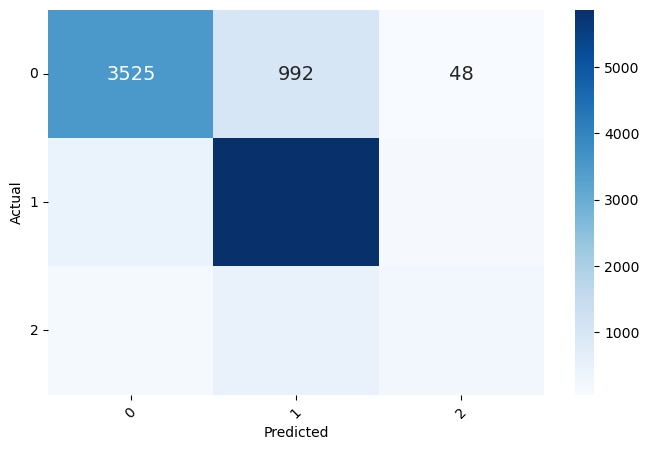

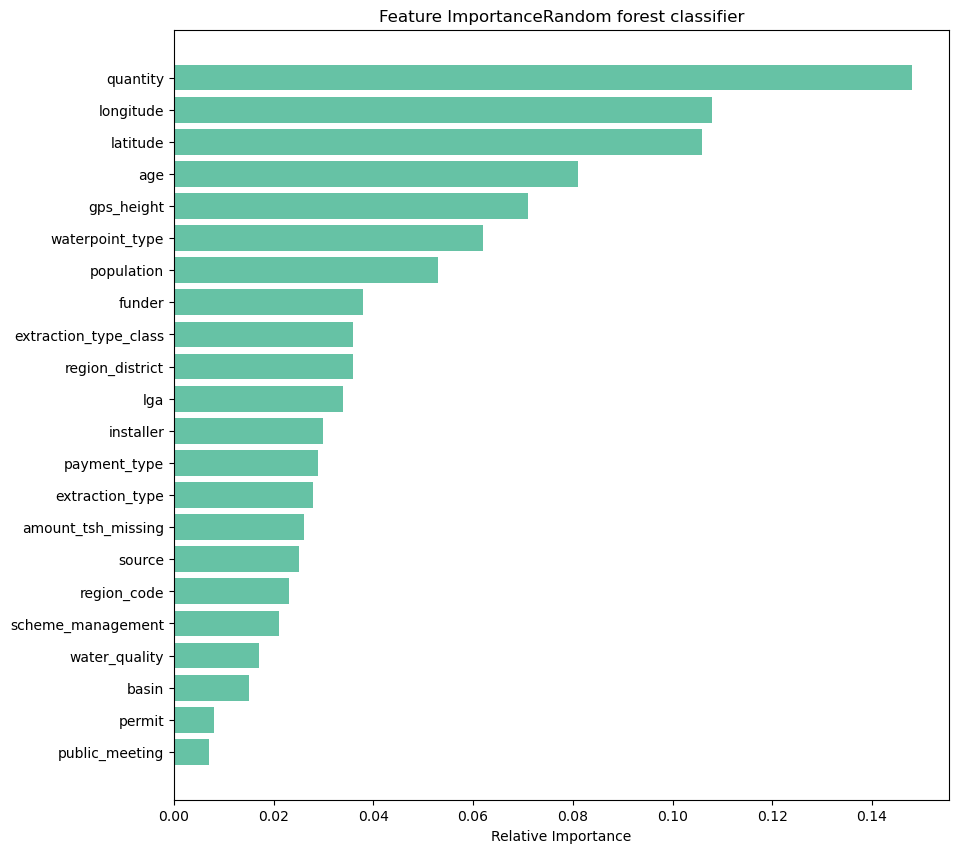

In [131]:
confusion_matrix_plotter(y_test, y_pred)

feature_importances(best_model, "Random forest classifier")
     

In [303]:
grid_param = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
    

}

XGB = XGBClassifier(random_state=42, warm_start = True)

grid_search_XGB = GridSearchCV(estimator = XGB, param_grid = grid_param, cv = stratified_kfold,  verbose = 2,  scoring = 'accuracy')


grid_search_XGB.fit(X_train, y_train)


print('Best Score:', grid_search_XGB.best_score_)
print('Parameters:', grid_search_XGB.best_params_)
print('Best Model:', grid_search_XGB.best_estimator_)

Fitting 5 folds for each of 729 candidates, totalling 3645 fits
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=100, subsample=0.8; total time=   1.7s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=100, subsample=0.8; total time=   1.7s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=100, subsample=0.8; total time=   2.8s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=100, subsample=0.8; total time=   1.7s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=100, subsample=0.8; total time=   1.7s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=100, subsample=0.9; total time=   1.6s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=100, subsample=0.9; total time

In [132]:
best_xg = XGBClassifier(colsample_bytree = 1.0, learning_rate = 0.1, max_depth = 7,
                        min_child_weight = 1, n_estimators = 300, subsample = 0.8,
                        random_state=42, warm_start=True)


best_xg.fit(X_train, y_train)
y_pred = best_xg.predict(X_test)
y_pred_train = best_xg.predict(X_train)

#print best model scores on test data
print("Accuracy score train: {}".format(accuracy_score(y_train, y_pred_train)))
print("Accuracy score test: {}".format(accuracy_score(y_test, y_pred)))
print()


print(classification_report(y_test, y_pred))


Accuracy score train: 0.8740319865319865
Accuracy score test: 0.8058080808080809

              precision    recall  f1-score   support

           0       0.84      0.76      0.80      4565
           1       0.80      0.90      0.85      6452
           2       0.64      0.30      0.41       863

    accuracy                           0.81     11880
   macro avg       0.76      0.66      0.69     11880
weighted avg       0.80      0.81      0.80     11880



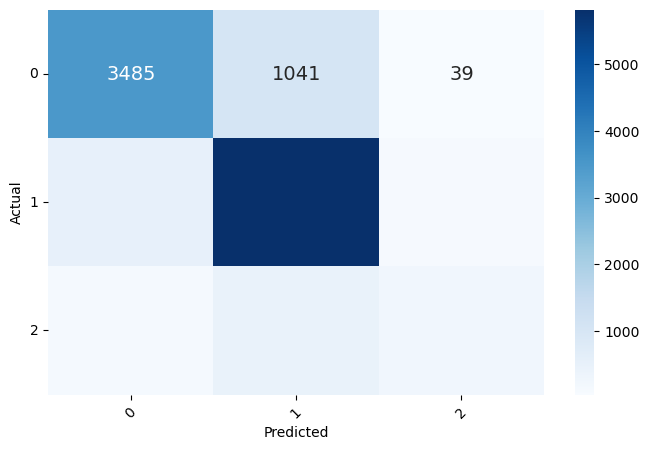

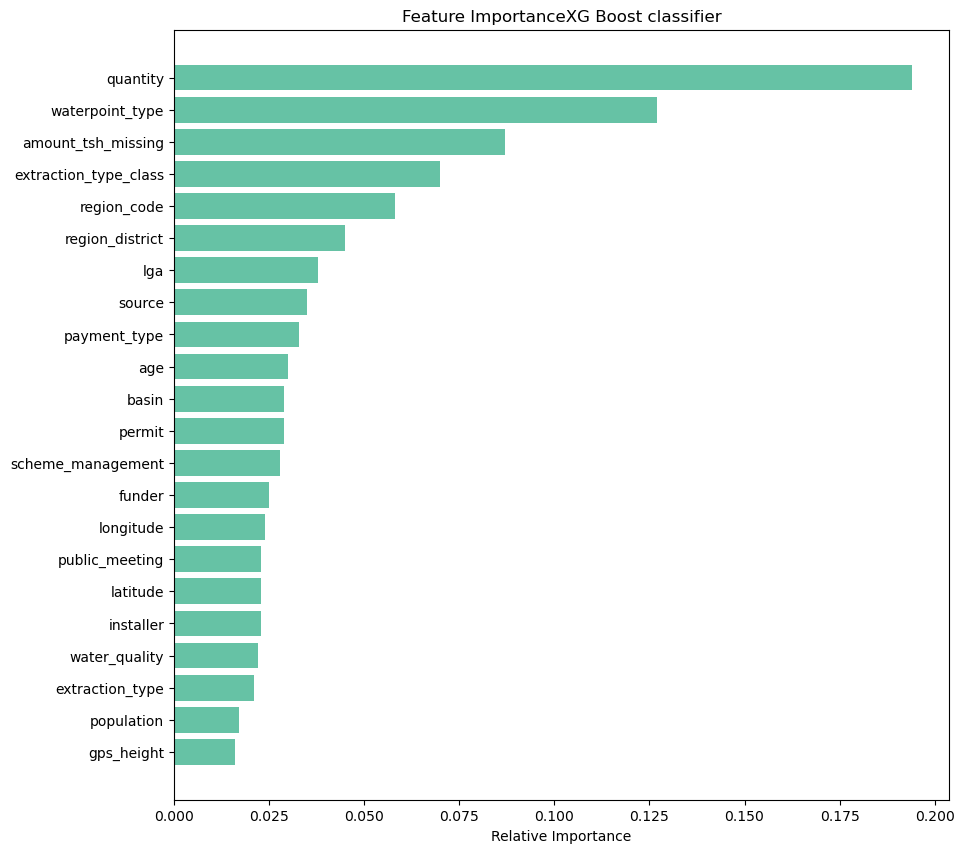

In [133]:
confusion_matrix_plotter(y_test, y_pred)

feature_importances(best_xg, "XG Boost classifier")
     

### SMOTE

In [134]:
print("Before OverSampling:", Counter(y))

sampling_strategy = {0: 32259, 1: 32259, 2: 16130}

smote = SMOTE(sampling_strategy=sampling_strategy, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X, y)

print("After OverSampling:", Counter(y_train_resampled))

Before OverSampling: Counter({1: 32259, 0: 22824, 2: 4317})
After OverSampling: Counter({1: 32259, 0: 32259, 2: 16130})


In [135]:
X_train_res, X_test_res, y_train_res, y_test_res = train_test_split(X_train_resampled,
                                                    y_train_resampled,
                                                    test_size=0.2, 
                                                    stratify=y_train_resampled,
                                                    random_state=42)

Accuracy score train: 0.8740319865319865
Accuracy score test: 0.8328580285182889

              precision    recall  f1-score   support

           0       0.87      0.82      0.85      6452
           1       0.80      0.86      0.83      6452
           2       0.82      0.80      0.81      3226

    accuracy                           0.83     16130
   macro avg       0.83      0.83      0.83     16130
weighted avg       0.83      0.83      0.83     16130



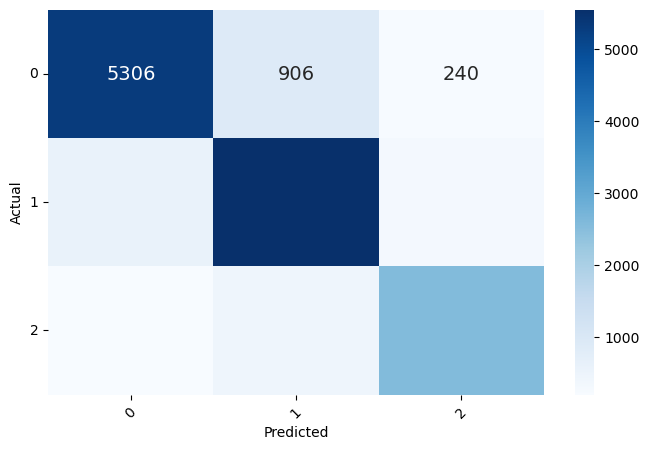

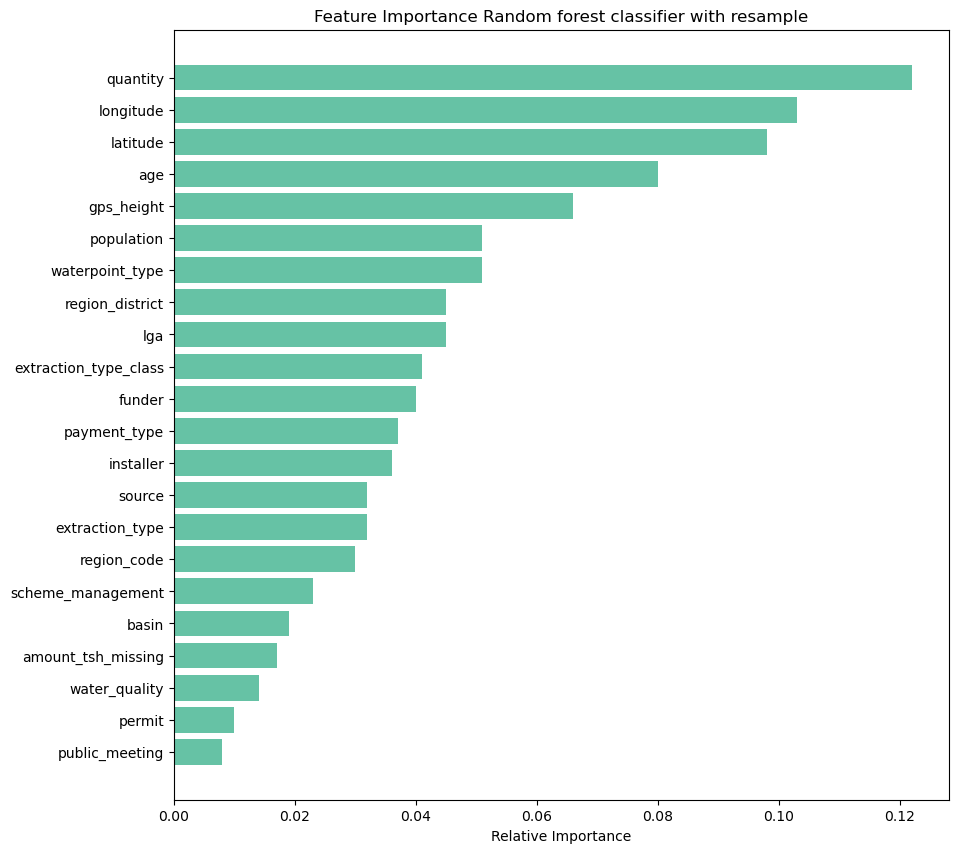

In [136]:
rf_res = RandomForestClassifier(criterion = 'gini', n_estimators= 500, max_depth = 20, max_features= 'log2').fit(X_train_res, y_train_res)
y_pred_res = rf_res.predict(X_test_res)

print("Accuracy score train: {}".format(accuracy_score(y_train, y_pred_train)))
print("Accuracy score test: {}".format(accuracy_score(y_test_res, y_pred_res)))
print()

print(classification_report(y_test_res, y_pred_res))

confusion_matrix_plotter(y_test_res, y_pred_res)

feature_importances(rf_res, " Random forest classifier with resample")
     

Intenté mejorar el modelo balanceando los datos. Utilicé SMOTE para aumentar los recuentos de las clases minoritarias, de modo que mis datos tuvieran una distribución de clases de 40% functional, 40% non-functional y 20% functional needs repair. Obtuve un peor resultado.

### Final Model

Al final probé cuatro modelos, Random Forest, Decision Tree, Logistic Regression y Xgboost. De estos cuatro los mejores dos fueron Random Forest y Xgboost. Ajustando los hiperparámetros de los dos modelos obtuve un resultado de 81,72% accuracy con Random Forest y 80,88% accuracy con Xgboost. Probé a balancear la distribución de las clases usando Smote pero obtuve peores resultados. Mi score final es 81,72%.

In [462]:
pred_final = rf_res.predict(test)

In [463]:
pred_names_dict = {0: 'non functional', 1: 'functional', 2: 'functional needs repair'}
pred_final_names = [pred_names_dict[value] for value in pred_final]

predictions_df = pd.DataFrame({'status_group': pred_final_names})

predictions_df.insert(0, 'id', test_set['id'])
predictions_df.head()

,id,status_group
0,50785,non functional
1,51630,functional
2,17168,functional
3,45559,non functional
4,49871,functional


In [464]:
predictions_df.to_csv('predictions.csv', index=False)